In [1]:
import mysql.connector
import pandas as pd
import matplotlib.pyplot as plt 
import pymysql
import numpy as np
from time import perf_counter
import time
import helper_functions as hf

In [2]:
import os
current_dir = os.getcwd()
print(current_dir)

/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc


# 1. Data 

In [4]:
folder_path = '/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/Sentilink Data'
file_parts = [
    '2024-04-15_sentilink_propelholdings_facets_part_1.csv',
    '2024-04-15_sentilink_propelholdings_facets_part_2.csv',
    '2024-04-15_sentilink_propelholdings_facets_part_3.csv',
    '2024-04-15_sentilink_propelholdings_facets_part_4.csv',
    '2024-04-15_sentilink_propelholdings_facets_part_5.csv',
    '2024-04-15_sentilink_propelholdings_facets_part_6.csv'
]

combined_df = pd.concat([pd.read_csv(os.path.join(folder_path, file)) for file in file_parts])
combined_df.head()

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/1831570863.py:11: DtypeWarning: Columns (2,17,18,20,76,85,86,87,88,89,90,91,92,93,94,95,96,97,102,109,110,112,114,115,116,117,118,120,121,122,123,125,127,128,153,154,155,166,189,206,207,208,209,210,211,238,240,242,243,257,263,264) have mixed types. Specify dtype option on import or set low_memory=False.
  combined_df = pd.concat([pd.read_csv(os.path.join(folder_path, file)) for file in file_parts])
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/1831570863.py:11: DtypeWarning: Columns (2,17,18,20,76,85,109,117,120,121,122,123,125,127,128,153,154,166,189,206,207,208,209,210,211,238,240,243,263,264) have mixed types. Specify dtype option on import or set low_memory=False.
  combined_df = pd.concat([pd.read_csv(os.path.join(folder_path, file)) for file in file_parts])
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/1831570863.py:11: DtypeWarning: Columns (2,17,18,20,76,85,86,87,88,89,90,91,9

,sentilink_application_sid,propelholdings_application_id,address_city_matches_records,address_distance_from_most_recent_on_record_km,address_history_yrs,address_min_distance_from_known_addresses_km,address_num_apps_cluster,address_num_identities_w_address_120d_cluster,address_num_identities_w_address_1y_cluster,address_num_identities_w_address_30d_cluster,...,ssn5_start_minus_dob_yrs,ssn_address_state_mismatch_score,ssn_bogus,ssn_frac_in_ssn_window_w_history,ssn_may_belong_to_a_minor,ssn_num_identities_cluster,ssn_prop_in_window,ssn_random_but_matches_state,zipcode_first_3_matches_manifest,zipcode_matches_manifest
0,H7XDAE-9HDWMD-2T4JTH-P671VN,2565634858,True,26.392402,NaN,4.046947,2.0,0.0,1.0,0.0,...,0.0,0.000000,False,NaN,False,1.0,NaN,NaN,True,True
1,H7XDAD-QQE9N7-BJJ94F-B1KWJ1,2565634856,True,1.909185,NaN,1.909185,5.0,NaN,NaN,NaN,...,NaN,0.000000,False,NaN,False,6.0,NaN,NaN,True,True
2,H7XD9T-PXK5T8-S835BP-G6C23N,2565634759,False,2346.063426,NaN,2.054761,36.0,3.0,4.0,0.0,...,-2.0,0.192993,False,NaN,False,1.0,NaN,NaN,False,False
3,H7XD6R-JKE8VD-RD8425-ADD0Z1,2565634215,True,0.000000,6.535250,0.000000,35.0,2.0,2.0,0.0,...,5.0,1.116071,False,NaN,False,2.0,NaN,NaN,True,True
4,H7XD6G-SMGYV7-4HE63V-5AR5CA,2565634181,True,1498.239721,12.788501,0.000000,34.0,0.0,0.0,0.0,...,16.0,0.070659,False,NaN,False,2.0,NaN,NaN,True,True


In [5]:
combined_df.shape

(5309945, 265)

In [6]:
combined_df

,sentilink_application_sid,propelholdings_application_id,address_city_matches_records,address_distance_from_most_recent_on_record_km,address_history_yrs,address_min_distance_from_known_addresses_km,address_num_apps_cluster,address_num_identities_w_address_120d_cluster,address_num_identities_w_address_1y_cluster,address_num_identities_w_address_30d_cluster,...,ssn5_start_minus_dob_yrs,ssn_address_state_mismatch_score,ssn_bogus,ssn_frac_in_ssn_window_w_history,ssn_may_belong_to_a_minor,ssn_num_identities_cluster,ssn_prop_in_window,ssn_random_but_matches_state,zipcode_first_3_matches_manifest,zipcode_matches_manifest
0,H7XDAE-9HDWMD-2T4JTH-P671VN,2565634858,True,26.392402,NaN,4.046947,2.0,0.0,1.0,0.0,...,0.0,0.000000,False,NaN,False,1.0,NaN,NaN,True,True
1,H7XDAD-QQE9N7-BJJ94F-B1KWJ1,2565634856,True,1.909185,NaN,1.909185,5.0,NaN,NaN,NaN,...,NaN,0.000000,False,NaN,False,6.0,NaN,NaN,True,True
2,H7XD9T-PXK5T8-S835BP-G6C23N,2565634759,False,2346.063426,NaN,2.054761,36.0,3.0,4.0,0.0,...,-2.0,0.192993,False,NaN,False,1.0,NaN,NaN,False,False
3,H7XD6R-JKE8VD-RD8425-ADD0Z1,2565634215,True,0.000000,6.535250,0.000000,35.0,2.0,2.0,0.0,...,5.0,1.116071,False,NaN,False,2.0,NaN,NaN,True,True
4,H7XD6G-SMGYV7-4HE63V-5AR5CA,2565634181,True,1498.239721,12.788501,0.000000,34.0,0.0,0.0,0.0,...,16.0,0.070659,False,NaN,False,2.0,NaN,NaN,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
884990,HT15QG-VC2Q2B-STGWPT-E9YGAP,2616924126,True,0.000000,2.075291,0.000000,12.0,0.0,0.0,0.0,...,15.0,0.000000,False,NaN,False,1.0,NaN,NaN,True,True
884991,HT15GQ-XZWT7X-021MDZ-Q3TKBZ,2616923613,True,3540.983206,10.488706,0.000000,8.0,0.0,0.0,0.0,...,17.0,0.000000,False,NaN,False,4.0,NaN,NaN,True,True
884992,HT15GP-S72VD1-F8CJV0-15E823,2616923622,True,NaN,NaN,NaN,29.0,0.0,0.0,0.0,...,16.0,0.000000,False,NaN,NaN,2.0,NaN,NaN,False,True
884993,HT156X-0WTXFJ-EGX5FR-VCR6RB,2616922883,True,11.075819,2.075291,0.000000,8.0,0.0,0.0,0.0,...,6.0,0.070659,False,NaN,False,4.0,NaN,NaN,True,True


In [ ]:
## dont run
def identify_date_columns(df):
    date_columns = []
    for col in df.columns:
        if 'date' in col.lower() or 'time' in col.lower() or 'year' in col.lower():
            date_columns.append(col)
        else:
            try:
                if pd.to_datetime(df[col], errors='coerce').notna().any():
                    date_columns.append(col)
            except Exception:
                continue
    return date_columns

date_columns = identify_date_columns(combined_df)
print(date_columns)

^^^ not needed since we have propelholdings_application_id == lead_sequence_id

In [7]:
def find_max_min_application_id(df, column_name):
    if column_name in df.columns:
        max_value = df[column_name].max()
        min_value = df[column_name].min()
        return max_value, min_value
    else:
        return None, None
    
max_id, min_id = find_max_min_application_id(combined_df, 'propelholdings_application_id')
print(f"Max lsid: {max_id}")
print(f"Min lsid: {min_id}")

Max lsid: 2617618360
Min lsid: 2562747526


In [8]:
combined_df.rename(columns={'propelholdings_application_id': 'lead_sequence_id'}, inplace=True)

In [ ]:
## dont run
conn= mysql.connector.connect(option_files='.my.cnf', option_groups = 'mysqlconnection',use_pure=True ,
                              auth_plugin='mysql_native_password')
limit = 2612698770 ##2617618360 ## max
difference = 100000
lower = 2575865769 ##2562747526 ## min
upper = lower+difference
i=0
timestart = time.time()
while lower <= limit:
    time0=time.time()
    temp = pd.read_sql("""
    SELECT a.lead_sequence_id, a.decision, if(la.origination_loan_id is not null, 1, 0) as isorigination
    FROM datawork.mk_application a
    left join dwh.rpt_leads_accepted la on a.lead_sequence_id = la.lead_sequence_id
    WHERE a.lead_sequence_id > """ + str(lower) + """
    AND a.lead_sequence_id <= """ + str(upper) + """ 
    ;""", con=conn)
    lower = lower + difference
    upper = upper + difference
    if i==0:
        leads_a = temp.copy()
    else:
        leads_a = pd.concat([leads_a, temp], ignore_index=True)
    i+=1    
    print(time.time()-time0)
    print(temp.shape)
    print("lower:",lower)
conn.close()
print('total time: ', time.time()-timestart)

## 1.1 Internal/Propel Data 

In [9]:
iters=300
conn= mysql.connector.connect(option_files='.my.cnf', option_groups = 'mysqlconnection', use_pure=True,
                              auth_plugin='mysql_native_password')
for i in range(iters):
    time1=time.time()
    temp =  pd.read_sql("""
    SELECT a.lead_sequence_id, a.organization_id, a.decision, if(la.origination_loan_id is not null, 1, 0) as isorigination
    FROM datawork.mk_application a
    left join dwh.rpt_leads_accepted la on a.lead_sequence_id = la.lead_sequence_id
    WHERE a.lead_sequence_id in """ + str(tuple(combined_df.lead_sequence_id[(i*np.floor(len(combined_df)/iters)).astype(int):((i+1)*np.floor(len(combined_df)/iters)).astype(int)].to_list())) + """
    ;""", con = conn)
    print(time.time()-time1)
    print(i)
    print(temp.shape)
    if i==0:
        internal_df = temp.copy()
    else:
        internal_df = pd.concat([internal_df, temp], ignore_index=True)

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/1645539359.py:6: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  temp =  pd.read_sql("""


10.35646390914917
0
(17699, 4)
8.40306305885315
1
(17694, 4)
9.453965187072754
2
(17699, 4)
10.299189805984497
3
(17699, 4)
10.411989688873291
4
(17699, 4)
9.355228185653687
5
(17699, 4)
8.799761295318604
6
(17699, 4)
9.214586734771729
7
(17699, 4)
7.968033790588379
8
(17699, 4)
8.203299283981323
9
(17699, 4)
8.594038963317871
10
(17699, 4)
6.8712241649627686
11
(17699, 4)
6.004538059234619
12
(17699, 4)
6.2619898319244385
13
(17660, 4)
6.956457138061523
14
(17672, 4)
7.740273952484131
15
(17692, 4)
5.352917909622192
16
(17699, 4)
5.811746120452881
17
(17698, 4)
8.898788213729858
18
(17698, 4)
7.691130876541138
19
(17666, 4)
7.982858896255493
20
(17699, 4)
9.190967082977295
21
(17698, 4)
9.306540727615356
22
(17699, 4)
10.025931596755981
23
(17698, 4)
8.995926856994629
24
(17643, 4)
7.79562783241272
25
(17693, 4)
8.700822114944458
26
(17693, 4)
9.804986000061035
27
(17653, 4)
8.592708110809326
28
(17694, 4)
7.648782968521118
29
(17699, 4)
7.969095945358276
30
(17699, 4)
8.4264540672302

5.165925979614258
251
(17699, 4)
4.150693893432617
252
(17698, 4)
3.6433968544006348
253
(17699, 4)
5.375287055969238
254
(17671, 4)
5.577426910400391
255
(17696, 4)
5.178961753845215
256
(17698, 4)
5.39676308631897
257
(17684, 4)
5.436864852905273
258
(17657, 4)
4.6462719440460205
259
(17698, 4)
4.954164981842041
260
(17677, 4)
5.4878599643707275
261
(17659, 4)
6.611950159072876
262
(17682, 4)
6.712247133255005
263
(17666, 4)
6.945219039916992
264
(17693, 4)
6.983940839767456
265
(17692, 4)
6.390829086303711
266
(17695, 4)
6.000149965286255
267
(17699, 4)
5.981129884719849
268
(17698, 4)
6.108612775802612
269
(17698, 4)
4.131944894790649
270
(17697, 4)
3.851940870285034
271
(17699, 4)
5.17243504524231
272
(17572, 4)
4.64743185043335
273
(17691, 4)
4.246264696121216
274
(17697, 4)
4.345365047454834
275
(17699, 4)
4.219223976135254
276
(17699, 4)
4.358973026275635
277
(17699, 4)
4.200550317764282
278
(17698, 4)
3.70245099067688
279
(17698, 4)
3.5337038040161133
280
(17699, 4)
5.23850131

#### Merge internal and sentilink 

In [10]:
merged_df = pd.merge(combined_df, internal_df, on='lead_sequence_id')
merged_df.shape

(5308343, 268)

#### Get fpd data from the merged_df (Use isFPD as the main metric for analysis) 

In [11]:
fpd_df = hf.get_more_fpd(merged_df)

We will excecute 530 iterations:



/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.9636611938476562


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7594280242919922


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.4764840602874756


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.653920888900757


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.7962899208068848


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  3.133046865463257


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.915255069732666


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  3.009451150894165


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.5255820751190186


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.1933577060699463


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.4393129348754883


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.2140207290649414


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.751659870147705


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  3.3111720085144043


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  5.076107025146484


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.0689830780029297


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.9804000854492188


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.016183853149414


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.985795021057129


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.7468831539154053


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.2263379096984863


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.714324951171875


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4705479145050049


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7458069324493408


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.678300380706787


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8185451030731201


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.2492117881774902


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.233935832977295


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9450478553771973


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.782660961151123


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5704262256622314


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.875040054321289


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.177673816680908


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6986608505249023


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8779191970825195


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9062128067016602


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8803610801696777


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6860148906707764


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.0342957973480225


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.916208028793335


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6774940490722656


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.3228919506073


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8495762348175049


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8872709274291992


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5710930824279785


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8434348106384277


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9023852348327637


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.2052032947540283


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.776427984237671


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8617229461669922


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8098862171173096


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.503716230392456


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9943161010742188


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.2665438652038574


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6410160064697266


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9750149250030518


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7520420551300049


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6306512355804443


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5353999137878418


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6099119186401367


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7031850814819336


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5871260166168213


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.705198049545288


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5287806987762451


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4713549613952637


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.374851942062378


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.457056999206543


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.594024896621704


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9161639213562012


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7880909442901611


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.592930793762207


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5137147903442383


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4882590770721436


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7741270065307617


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6564440727233887


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6763923168182373


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6996068954467773


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7636620998382568


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.080137252807617


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5872998237609863


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3759679794311523


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.848944902420044


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9578051567077637


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.1248397827148438


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.58781099319458


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4806373119354248


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5054850578308105


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.704422950744629


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.0360801219940186


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.884469985961914


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6195881366729736


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.761329174041748


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.616934061050415


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5918400287628174


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6730449199676514


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7558550834655762


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6423530578613281


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7464797496795654


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9033269882202148


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6368999481201172


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5552468299865723


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5024960041046143


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7291178703308105


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.558751106262207


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5242178440093994


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4830999374389648


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.450523853302002


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3739309310913086


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3827478885650635


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2662830352783203


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4748201370239258


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3774731159210205


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4474947452545166


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.192126989364624


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0746679306030273


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1904900074005127


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1688759326934814


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0921940803527832


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1047401428222656


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.121608018875122


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.300011157989502


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1170971393585205


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0705652236938477


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1979362964630127


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9964871406555176


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0861680507659912


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3040339946746826


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1813859939575195


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1771278381347656


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2854888439178467


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2464940547943115


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4051902294158936


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2761337757110596


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2883777618408203


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1687049865722656


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.092622995376587


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2034060955047607


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3402752876281738


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3458161354064941


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.283616065979004


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.158560037612915


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.092223882675171


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2970049381256104


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2784340381622314


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1891160011291504


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1941008567810059


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0739448070526123


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.977611780166626


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0996448993682861


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.385396957397461


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2786891460418701


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.173304796218872


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.974539041519165


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.227466106414795


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0211117267608643


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4837682247161865


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2788960933685303


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2876760959625244


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9656622409820557


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9928140640258789


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3071608543395996


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5469779968261719


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2201859951019287


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1886777877807617


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0759150981903076


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9223151206970215


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0445430278778076


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4130980968475342


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2743439674377441


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2720201015472412


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0747127532958984


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8513259887695312


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1047861576080322


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3759727478027344


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2132461071014404


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2736473083496094


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.009058952331543


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9169790744781494


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0826349258422852


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5890541076660156


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1904399394989014


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2484769821166992


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0686960220336914


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9100620746612549


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8764078617095947


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2879350185394287


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3779881000518799


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3027598857879639


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2393579483032227


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9989838600158691


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9665529727935791


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9898810386657715


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.384490966796875


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3137781620025635


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2276818752288818


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0945279598236084


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9851577281951904


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9946198463439941


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9970111846923828


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.181077003479004


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1810822486877441


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1693580150604248


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0613172054290771


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.986914873123169


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8869829177856445


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8937311172485352


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1758511066436768


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5774059295654297


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1862502098083496


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3979957103729248


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2128241062164307


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8529059886932373


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6219372749328613


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9694581031799316


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.9028558731079102


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8000731468200684


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7295286655426025


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6931178569793701


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6440119743347168


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6342360973358154


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6604371070861816


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6784310340881348


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6741440296173096


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6474411487579346


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.720984935760498


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8152260780334473


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.794583797454834


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7703871726989746


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6852662563323975


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7022099494934082


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7388739585876465


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7315318584442139


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.730884075164795


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.650373935699463


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7074830532073975


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.752845048904419


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.617051124572754


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6382949352264404


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.627216100692749


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6179556846618652


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.597080945968628


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.492128849029541


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5461158752441406


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6007239818572998


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5106730461120605


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6117398738861084


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5707347393035889


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.677793025970459


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.606611967086792


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7102530002593994


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6424598693847656


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6541039943695068


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7516307830810547


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6377649307250977


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6772711277008057


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6955668926239014


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6701409816741943


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7588508129119873


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7270939350128174


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.89198899269104


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.805891990661621


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7497491836547852


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7511730194091797


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8726110458374023


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7179410457611084


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7517340183258057


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7530131340026855


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8038549423217773


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6374220848083496


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7428030967712402


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.625581979751587


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6028211116790771


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.620405912399292


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5065710544586182


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.495704174041748


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.519592046737671


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  1
Runtime:  1.544896125793457


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.625878095626831


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.511380910873413


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5015430450439453


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3577699661254883


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.381972074508667


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1787359714508057


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2962620258331299


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2579329013824463


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2175631523132324


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.380800724029541


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2819221019744873


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2038629055023193


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1130399703979492


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0712189674377441


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9880349636077881


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.377249002456665


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.487037181854248


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6482102870941162


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7715380191802979


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7370901107788086


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5698659420013428


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6004321575164795


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5032026767730713


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6254773139953613


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4772059917449951


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6233839988708496


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4710259437561035


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4658470153808594


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.52531099319458


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.501101016998291


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.493941068649292


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4834771156311035


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4996647834777832


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5220942497253418


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5923199653625488


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5129568576812744


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4906680583953857


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5078482627868652


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5216519832611084


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.50059175491333


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4850099086761475


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.724179983139038


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8682219982147217


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.0408031940460205


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.809502124786377


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6598970890045166


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6300959587097168


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5073521137237549


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6198301315307617


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4852359294891357


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3981399536132812


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2776672840118408


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5039880275726318


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3184378147125244


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5083699226379395


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3947961330413818


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1278400421142578


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2476840019226074


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0929677486419678


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.218149185180664


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2814710140228271


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2862372398376465


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1899518966674805


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.177936315536499


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2013869285583496


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1288948059082031


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2788851261138916


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.127974033355713


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.272219181060791


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2275011539459229


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9882969856262207


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0828049182891846


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1011788845062256


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.074615240097046


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1787841320037842


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3094358444213867


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2135119438171387


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1862871646881104


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2163560390472412


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2918291091918945


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2322900295257568


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1207361221313477


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3077681064605713


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.098052740097046


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1020631790161133


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1770596504211426


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0659828186035156


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2871270179748535


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.004791021347046


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0043020248413086


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9903090000152588


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9361038208007812


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9775891304016113


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.906437873840332


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2694921493530273


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5239310264587402


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5194129943847656


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5683279037475586


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6285192966461182


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4736762046813965


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5157749652862549


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5359418392181396


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5611648559570312


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6158556938171387


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3870878219604492


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.558081865310669


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.530700922012329


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5863709449768066


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5574891567230225


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6312382221221924


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4390311241149902


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4583020210266113


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5642681121826172


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4632360935211182


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5040831565856934


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3114428520202637


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3196139335632324


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5072381496429443


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6147980690002441


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4510478973388672


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.441338062286377


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.453415870666504


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5587351322174072


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6272799968719482


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5928237438201904


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3578331470489502


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4241459369659424


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3931539058685303


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2881650924682617


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4882900714874268


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2725658416748047


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4249069690704346


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3259503841400146


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.487380027770996


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.377140998840332


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1356720924377441


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.174217939376831


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.114637851715088


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9065511226654053


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9456870555877686


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9994118213653564


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.7663700580596924


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9087193012237549


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8541028499603271


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.6933190822601318


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.7056870460510254


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.5576028823852539


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.6264939308166504


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1567270755767822


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0678188800811768


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1974289417266846


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0033273696899414


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2196810245513916


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0837769508361816


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0821290016174316


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0692691802978516


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0949609279632568


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9838778972625732


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0237209796905518


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1056976318359375


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9546732902526855


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1937003135681152


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0295188426971436


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0250208377838135


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.929102897644043


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0424590110778809


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0041983127593994


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.1014690399169922


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9891507625579834


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9743087291717529


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8991692066192627


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9183390140533447


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3059148788452148


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4044179916381836


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4428391456604004


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.230726957321167


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.353480339050293


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0655033588409424


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3155879974365234


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2796099185943604


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.264559030532837


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.2075788974761963


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.9972600936889648


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.0743350982666016


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.228799819946289


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.288010835647583


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4071130752563477


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5171880722045898


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.696897029876709


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5239078998565674


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5661811828613281


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6909010410308838


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6144871711730957


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6200230121612549


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.605133056640625


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6827099323272705


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6307172775268555


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.560215950012207


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6221339702606201


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.507157802581787


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.610422134399414


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5331039428710938


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5086588859558105


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3769779205322266


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3876960277557373


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6893608570098877


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.575430154800415


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5027179718017578


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3160629272460938


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4858031272888184


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.7526650428771973


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6525001525878906


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5232419967651367


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5377037525177002


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.3080949783325195


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.7740888595581055


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.7827470302581787


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.6430041790008545


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.7960629463195801


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.684049129486084


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  0.8862519264221191


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4879250526428223


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.4909820556640625


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5364038944244385


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.5240967273712158


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.651392936706543


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8917887210845947


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.2363059520721436


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8552570343017578


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.140036106109619


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.6399729251861572


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.3138720989227295


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.633528232574463


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.3944919109344482


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.534722089767456


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.6026687622070312


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.321232795715332


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.1119630336761475


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.1298701763153076


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  3.0108249187469482


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.214246988296509


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.298207998275757


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.088168144226074


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.842371702194214


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.209533929824829


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.269672155380249


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.1249499320983887


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.2224950790405273


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.8161299228668213


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.532320022583008


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  2.0068092346191406


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.893725872039795


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.8413059711456299


/Users/ethan.tait/Library/CloudStorage/OneDrive-PropelHoldingsInc/helper_functions.py:405: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  all_payments =  pd.read_sql("""


Query successful
exceptions count:  0
Runtime:  1.6262547969818115


In [12]:
fpd_df = fpd_df[fpd_df['isFPD'] != 2]
fpd_df.shape

(73980, 10)

## 1.2 Get Ever_30dpd_in_90 data 

In [13]:
pd.options.mode.use_inf_as_na = True
days_since_origination = 90
dpd_days = 30

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/3684431059.py:1: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  pd.options.mode.use_inf_as_na = True


In [14]:
# NC MK loans originated in 2023 Q3 to 2024 Q2 (Start +1 month for both) 
##Change origination_time range to alter date range & org_id***
conn= mysql.connector.connect(option_files='.my.cnf', option_groups = 'mysqlconnection',use_pure=True ,
                              auth_plugin='mysql_native_password')
data_90 = pd.read_sql("""select
                            lbl.base_loan_id,
                            a.lead_provider_name,
                            llh.lead_sequence_id,
                            la.origination_time,
                            llh.entity_name,
                            lpsi.payment_schedule_item_id,
                            lpsi.item_date,
                            lpsi.item_type,
                            lpsi.status as payment_status,
                            lpsi.total_amount,
                            lps.payment_schedule_id,
                            #TIMESTAMPDIFF(DAY, la.origination_time, CURDATE()) AS days_since_origination,
                            TIMESTAMPDIFF(DAY, la.origination_time, lpsi.item_date) AS payment_days_since_origination,
                            lbl.loan_amount, 
                            a.UW_STREAM_ID,
                            la.pay_frequency,
                            (select if(lpsi2.status in ('Return', 'MISSED'), 1, 0) from jaglms.lms_payment_schedule_items lpsi2
                            where lpsi2.payment_schedule_id = lps.payment_schedule_id and lps.is_collections!=1 and (lpsi2.item_type != 'C' OR lpsi2.item_type is null) order by item_date limit 1) as isFPD
                            from jaglms.lms_loan_header llh
                            INNER JOIN datawork.mk_application_more mkam on llh.lead_sequence_id = mkam.lead_sequence_id
                            inner join jaglms.lms_base_loans lbl on llh.loan_header_id = lbl.loan_header_id
                            inner join jaglms.lms_payment_schedules lps on lps.base_loan_id = lbl.base_loan_id
                            inner join jaglms.lms_payment_schedule_items lpsi on (lps.payment_schedule_id = lpsi.payment_schedule_id) #and lps.is_collections = 0)
                            inner join dwh.rpt_leads_accepted la on la.lead_sequence_id = llh.lead_sequence_id
                            inner join datawork.mk_application a on llh.lead_sequence_id = a.lead_sequence_id
                            inner join datawork.mk_critical_info mkc on llh.lead_sequence_id = mkc.lead_sequence_id
                            where
                            llh.loan_header_id is not null 
                            and (lpsi.payment_mode != 'CONCESSION' or lpsi.payment_mode is null)
                            and lbl.loan_status !='Pending' 
                            and llh.status not in ('void', 'withdraw', 'Credit Return', 'Closed','closed') 
                            and lpsi.status not in ('scheduled','cancelled','SENT','bypass','Correction','Pending')
                            and la.IsApplicationTest = 0
                            and llh.is_returning = 0
                            and llh.last_name not in ('Schwartzenegger', 'Goler')
                            and la.application_status = 'Originated'
                            and la.origination_time >= '2023-08-01' and la.origination_time <= '2024-04-02'
                            AND la.organization_id != 5
                            and TIMESTAMPDIFF(DAY, la.origination_time, lpsi.item_date) <= """+str(days_since_origination)+"""
                            and (lpsi.item_type != 'C' OR lpsi.item_type is null)
                            ;""", con = conn)
conn.close()

print(data_90.shape)

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/1247536520.py:5: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  data_90 = pd.read_sql("""select


(427140, 16)


In [15]:
data_90['payment_status'] = data_90['payment_status'].str.lower().copy()

In [16]:
print(data_90.shape)
data_90 = data_90[data_90['payment_status'].isin(['return', 'missed', 'cleared'])]
print(data_90.shape)

(427140, 16)
(427138, 16)


In [17]:
data_90.sort_values(['base_loan_id','item_date'],inplace=True)

In [18]:
data_90['item_date'] = pd.to_datetime(data_90['item_date'])

In [19]:
# exclude missed payments after day60 (not enough time to see if they are recovered)
print(data_90.shape)
data_90 = data_90[~ ((data_90.payment_days_since_origination >(days_since_origination-dpd_days)) &
                     (data_90.payment_status.isin(['return','missed'])))]
print(data_90.shape)

(427138, 16)
(387341, 16)


In [20]:
#set 30+dpd as 0 for all payments
data_90['Ever_30DPD_in_90']=0

In [21]:
# if the missed payment is +30 dpd
# look for missed payments, if to payment amount is not paid in the next 30 days
for i in data_90[data_90.payment_status.isin(['return','missed'])].base_loan_id.unique():
    for j in data_90[(data_90.base_loan_id==i) & (data_90.payment_status.isin(['return','missed']))].payment_schedule_item_id.unique():
        data_90.loc[((data_90.base_loan_id==i) & (data_90.payment_status.isin(['return','missed'])) & (data_90.payment_schedule_item_id==j)),'Ever_30DPD_in_90']= 1         
        if ((data_90[(data_90.base_loan_id==i) & (data_90.payment_status.isin(['cleared'])) & (data_90.item_date> (data_90[data_90.payment_schedule_item_id==j].item_date.values[0])) & ((data_90.item_date - (data_90[data_90.payment_schedule_item_id==j].item_date.values[0])).dt.days<= dpd_days)].total_amount.sum()) >= data_90[(data_90.base_loan_id==i) & (data_90.payment_status.isin(['return','missed'])) & (data_90.payment_schedule_item_id==j)].total_amount).bool():
            data_90.loc[((data_90.base_loan_id==i) & (data_90.payment_status.isin(['return','missed'])) & (data_90.payment_schedule_item_id==j)),'Ever_30DPD_in_90']= 0
data_90_label = data_90.groupby(['lead_sequence_id'])['Ever_30DPD_in_90'].max().to_frame()

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/1215208305.py:6: FutureWarning: Series.bool is now deprecated and will be removed in future version of pandas
  if ((data_90[(data_90.base_loan_id==i) & (data_90.payment_status.isin(['cleared'])) & (data_90.item_date> (data_90[data_90.payment_schedule_item_id==j].item_date.values[0])) & ((data_90.item_date - (data_90[data_90.payment_schedule_item_id==j].item_date.values[0])).dt.days<= dpd_days)].total_amount.sum()) >= data_90[(data_90.base_loan_id==i) & (data_90.payment_status.isin(['return','missed'])) & (data_90.payment_schedule_item_id==j)].total_amount).bool():


In [22]:
data_90_label = data_90.groupby(['lead_sequence_id'])['Ever_30DPD_in_90'].max().to_frame()
data_90_label

,Ever_30DPD_in_90
lead_sequence_id,
2572814487,0
2575081455,0
2575626454,1
2575722633,0
2576266317,0
...,...
2617616002,1
2617616418,1
2617616493,0


In [23]:
data_90_label['Ever_30DPD_in_90'].value_counts()

Ever_30DPD_in_90
0    69456
1    11743
Name: count, dtype: int64

In [24]:
data_90_label['Ever_30DPD_in_90'].value_counts(dropna=False,normalize=True)

Ever_30DPD_in_90
0    0.85538
1    0.14462
Name: proportion, dtype: float64

## 1.3 Final df (5310065, 269)
#### - includes: fpd, propel, sentilink, Ever_30dpd_in_90

In [25]:
df = pd.merge(left=merged_df, right=fpd_df, on='lead_sequence_id', how='left')
df.head()

,sentilink_application_sid,lead_sequence_id,address_city_matches_records,address_distance_from_most_recent_on_record_km,address_history_yrs,address_min_distance_from_known_addresses_km,address_num_apps_cluster,address_num_identities_w_address_120d_cluster,address_num_identities_w_address_1y_cluster,address_num_identities_w_address_30d_cluster,...,isorigination,item_date,payment_schedule_id,status,payment_mode,total_amount,payment_sequence,customer_id,base_loan_id,isFPD
0,H7XDAE-9HDWMD-2T4JTH-P671VN,2565634858,True,26.392402,NaN,4.046947,2.0,0.0,1.0,0.0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,H7XDAD-QQE9N7-BJJ94F-B1KWJ1,2565634856,True,1.909185,NaN,1.909185,5.0,NaN,NaN,NaN,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,H7XD9T-PXK5T8-S835BP-G6C23N,2565634759,False,2346.063426,NaN,2.054761,36.0,3.0,4.0,0.0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,H7XD6R-JKE8VD-RD8425-ADD0Z1,2565634215,True,0.000000,6.535250,0.000000,35.0,2.0,2.0,0.0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,H7XD6G-SMGYV7-4HE63V-5AR5CA,2565634181,True,1498.239721,12.788501,0.000000,34.0,0.0,0.0,0.0,...,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
final_df = pd.merge(left=df, right=data_90_label, on='lead_sequence_id', how='left')

In [27]:
columns_drop = ['sentilink_application_sid', 'payment_schedule_id', 'item_date', 'status', 'payment_mode', 
             'total_amount', 'payment_sequence', 'customer_id']
final_df = final_df.drop(columns=columns_drop)

In [28]:
final_df['decision'] = final_df['decision'].map({'ACCEPT':1,'REJECT':0})

In [29]:
final_df.isFPD.value_counts()

isFPD
0.0    67763
1.0     6217
Name: count, dtype: int64

In [30]:
final_df.isorigination.value_counts()

isorigination
0    5234950
1      75116
Name: count, dtype: int64

In [31]:
final_df

,lead_sequence_id,address_city_matches_records,address_distance_from_most_recent_on_record_km,address_history_yrs,address_min_distance_from_known_addresses_km,address_num_apps_cluster,address_num_identities_w_address_120d_cluster,address_num_identities_w_address_1y_cluster,address_num_identities_w_address_30d_cluster,address_num_identities_w_address_60d_cluster,...,ssn_prop_in_window,ssn_random_but_matches_state,zipcode_first_3_matches_manifest,zipcode_matches_manifest,organization_id,decision,isorigination,base_loan_id,isFPD,Ever_30DPD_in_90
0,2565634858,True,26.392402,NaN,4.046947,2.0,0.0,1.0,0.0,0.0,...,NaN,NaN,True,True,1.0,1.0,0,NaN,NaN,NaN
1,2565634856,True,1.909185,NaN,1.909185,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,True,True,1.0,0.0,0,NaN,NaN,NaN
2,2565634759,False,2346.063426,NaN,2.054761,36.0,3.0,4.0,0.0,1.0,...,NaN,NaN,False,False,3.0,0.0,0,NaN,NaN,NaN
3,2565634215,True,0.000000,6.535250,0.000000,35.0,2.0,2.0,0.0,1.0,...,NaN,NaN,True,True,3.0,0.0,0,NaN,NaN,NaN
4,2565634181,True,1498.239721,12.788501,0.000000,34.0,0.0,0.0,0.0,0.0,...,NaN,NaN,True,True,3.0,0.0,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5310061,2616967336,True,0.000000,5.492129,0.000000,11.0,0.0,0.0,0.0,0.0,...,NaN,NaN,True,True,2.0,1.0,0,NaN,NaN,NaN
5310062,2616966765,True,0.000000,7.824778,0.000000,34.0,0.0,0.0,0.0,0.0,...,NaN,NaN,True,True,3.0,0.0,0,NaN,NaN,NaN
5310063,2616966703,True,13.316022,NaN,8.447041,7.0,0.0,0.0,0.0,0.0,...,NaN,NaN,True,False,2.0,1.0,1,7352668.0,0.0,0.0
5310064,2616966638,True,0.000000,0.076660,0.000000,5.0,0.0,0.0,0.0,0.0,...,NaN,NaN,True,True,1.0,1.0,0,NaN,NaN,NaN


In [32]:
sample_perc = 0.05
finals_df = final_df.sample(frac=sample_perc, random_state=42)
finals_df

,lead_sequence_id,address_city_matches_records,address_distance_from_most_recent_on_record_km,address_history_yrs,address_min_distance_from_known_addresses_km,address_num_apps_cluster,address_num_identities_w_address_120d_cluster,address_num_identities_w_address_1y_cluster,address_num_identities_w_address_30d_cluster,address_num_identities_w_address_60d_cluster,...,ssn_prop_in_window,ssn_random_but_matches_state,zipcode_first_3_matches_manifest,zipcode_matches_manifest,organization_id,decision,isorigination,base_loan_id,isFPD,Ever_30DPD_in_90
4194438,2581553964,True,301.245714,14.713210,0.000000,5.0,0.0,2.0,0.0,0.0,...,NaN,NaN,True,True,3.0,0.0,0,NaN,NaN,NaN
4877579,2586762049,True,6.119029,15.189596,0.000000,22.0,0.0,1.0,0.0,0.0,...,NaN,NaN,True,True,1.0,1.0,1,6194055.0,0.0,0.0
2312621,2603061058,True,7.101594,35.214237,0.000000,31.0,0.0,2.0,0.0,0.0,...,NaN,NaN,True,True,3.0,1.0,0,NaN,NaN,NaN
2946704,2562805389,True,5.898205,5.842574,0.000000,17.0,0.0,0.0,0.0,0.0,...,NaN,NaN,True,True,1.0,0.0,0,NaN,NaN,NaN
3569583,2583401020,True,1.834053,14.491444,0.000000,46.0,0.0,2.0,0.0,0.0,...,NaN,NaN,True,True,1.0,0.0,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2273483,2602250737,True,0.000000,3.876797,0.000000,46.0,3.0,3.0,1.0,2.0,...,NaN,NaN,True,True,2.0,1.0,0,NaN,NaN,NaN
243080,2566547065,False,1497.259378,NaN,1497.259378,3.0,0.0,0.0,0.0,0.0,...,0.04878,False,False,False,4.0,1.0,0,NaN,NaN,NaN
3483487,2582768818,True,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,True,True,3.0,0.0,0,NaN,NaN,NaN
2716284,2612198953,True,0.000000,10.327173,0.000000,30.0,1.0,1.0,0.0,1.0,...,NaN,NaN,True,True,3.0,0.0,0,NaN,NaN,NaN


In [33]:
finals_df['Ever_30DPD_in_90'].value_counts()

Ever_30DPD_in_90
0.0    2441
1.0     358
Name: count, dtype: int64

In [34]:
finals_df['decision'].value_counts()

decision
0.0    200543
1.0     64958
Name: count, dtype: int64

# 2. Distribution visualization 

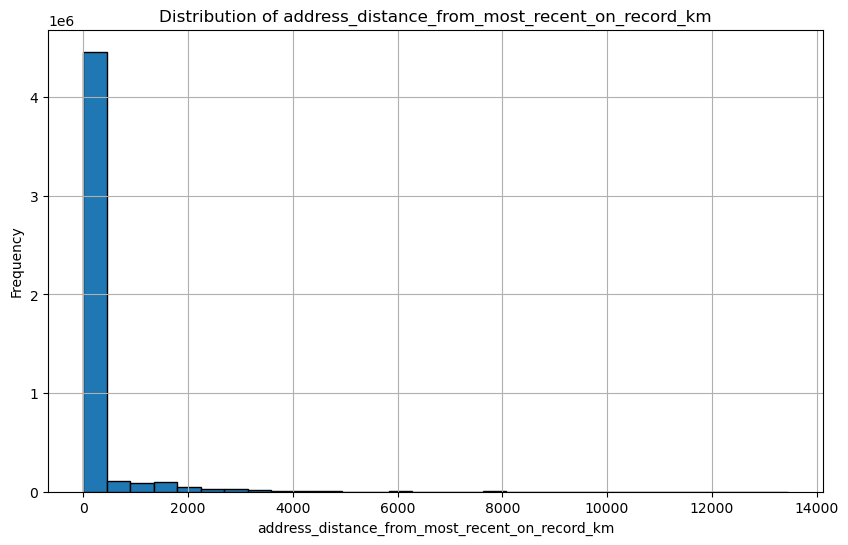

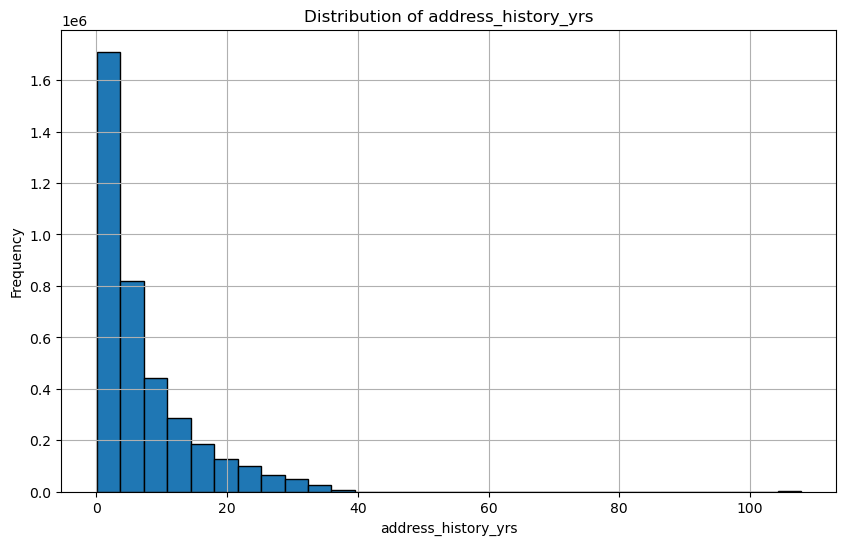

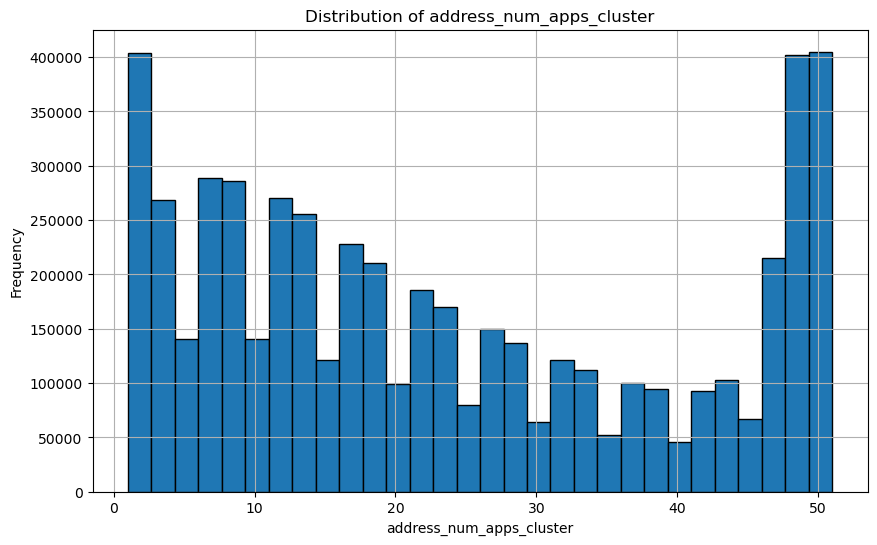

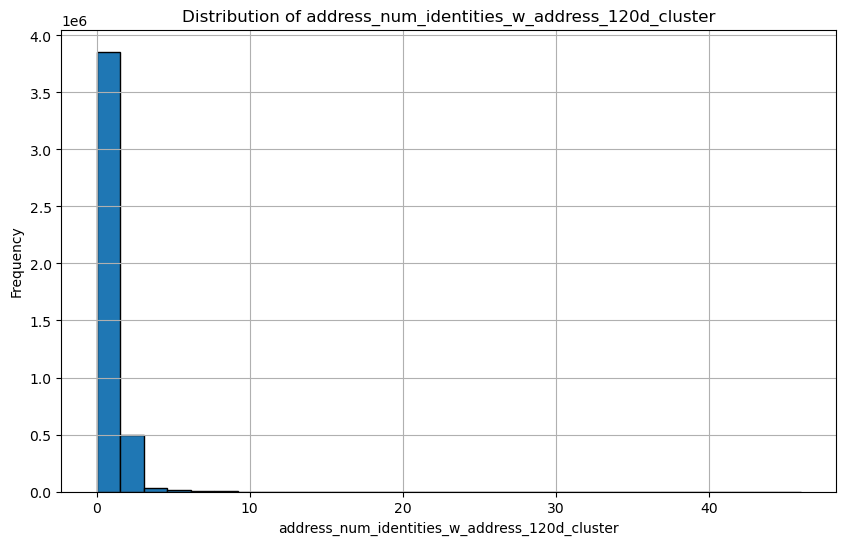

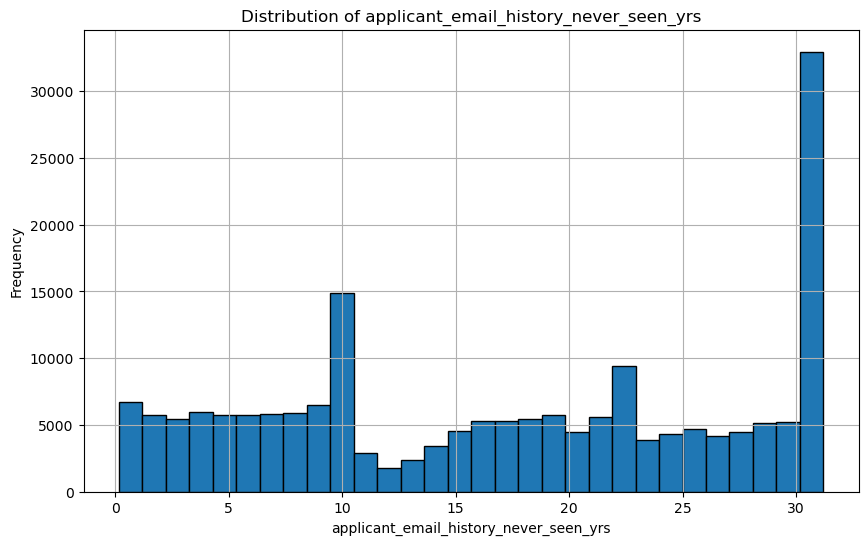

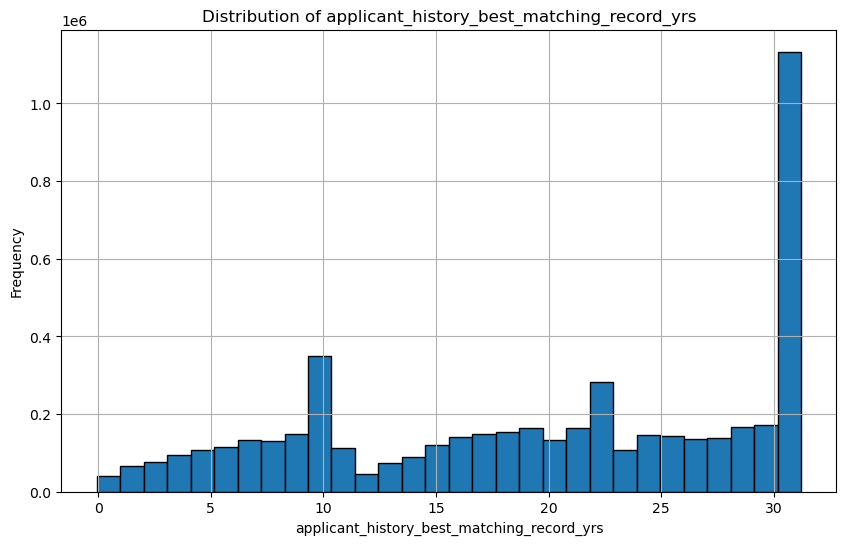

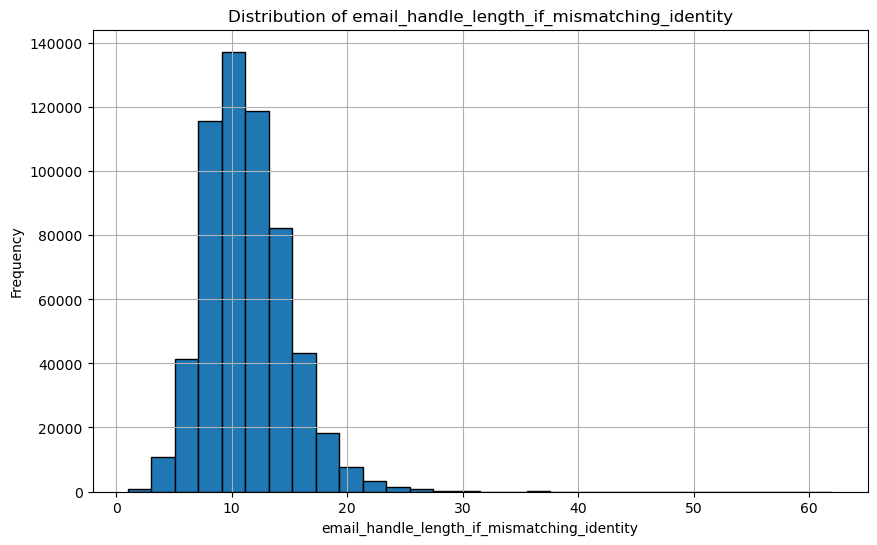

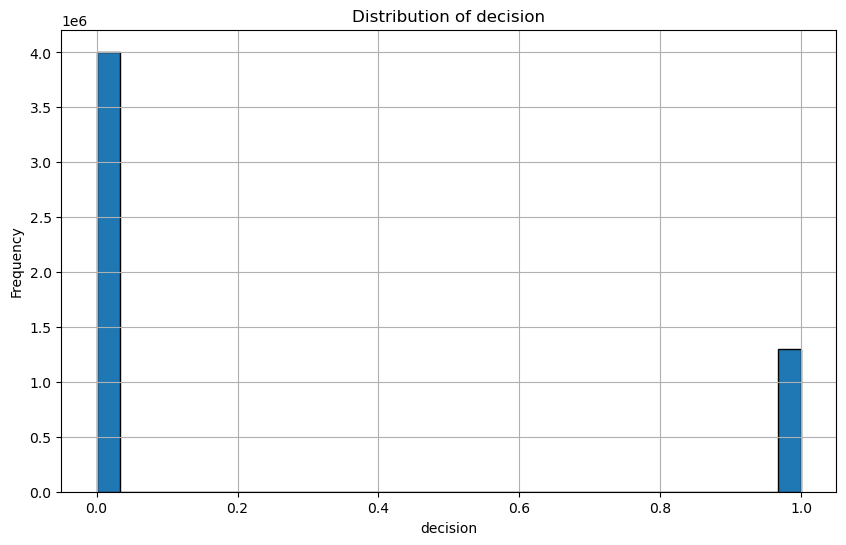

In [35]:
numeric_columns = [
    'address_distance_from_most_recent_on_record_km',
    'address_history_yrs',
    'address_num_apps_cluster',
    'address_num_identities_w_address_120d_cluster',
    'applicant_email_history_never_seen_yrs',
    'applicant_history_best_matching_record_yrs',
    'email_handle_length_if_mismatching_identity',
    'decision'
]

for column in numeric_columns:
    plt.figure(figsize=(10, 6))
    final_df[column].dropna().hist(bins=30, edgecolor='k')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

## 2.1 Ever_30dpd_in_90 visualization

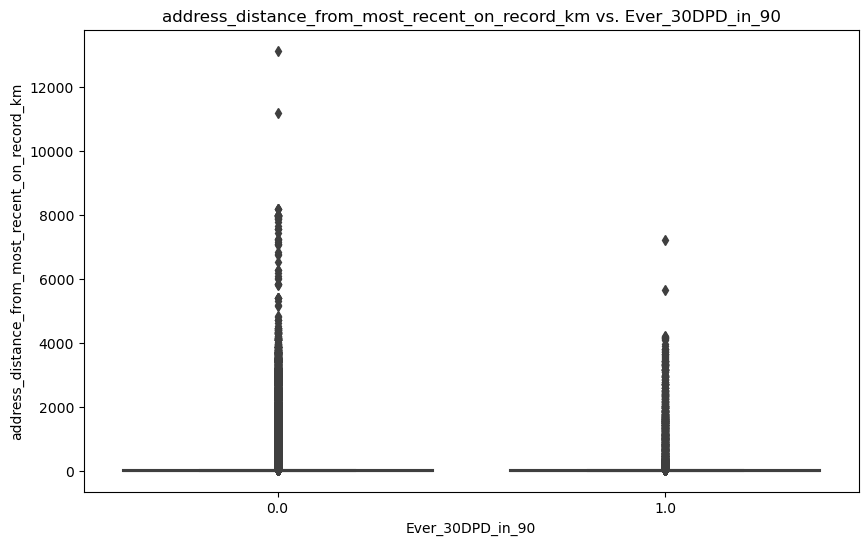

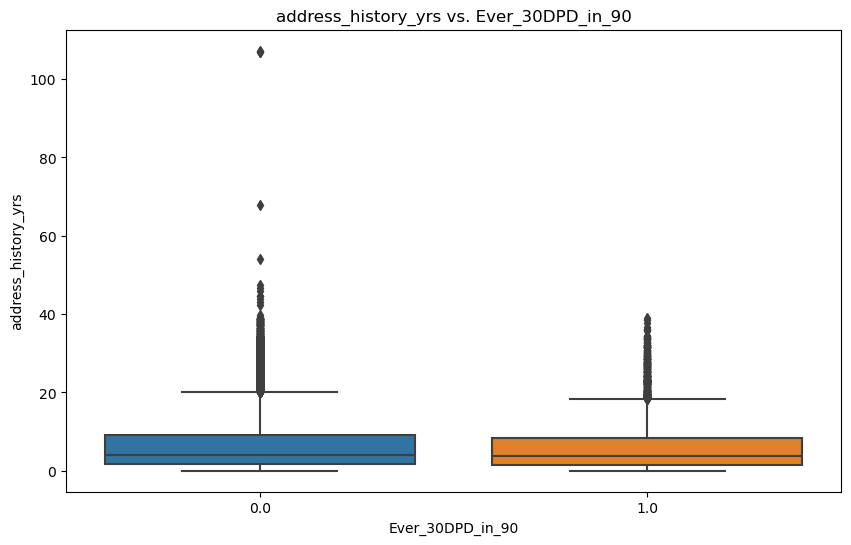

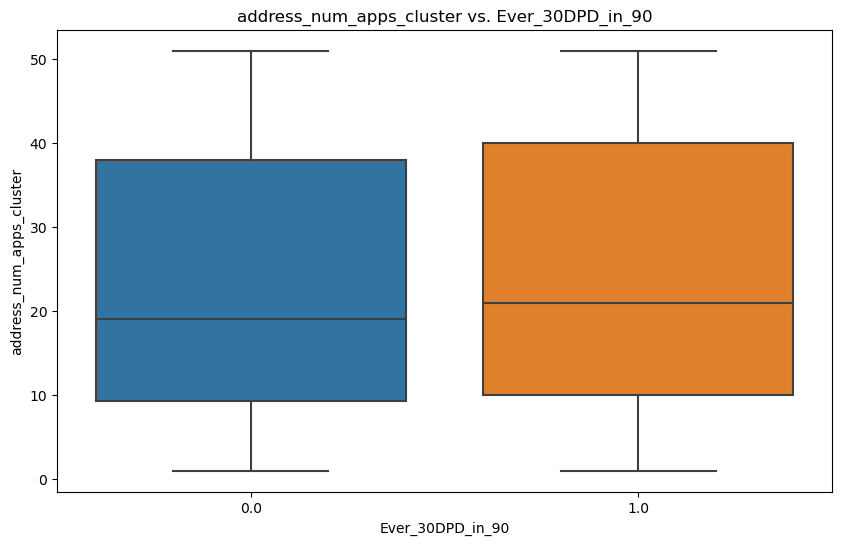

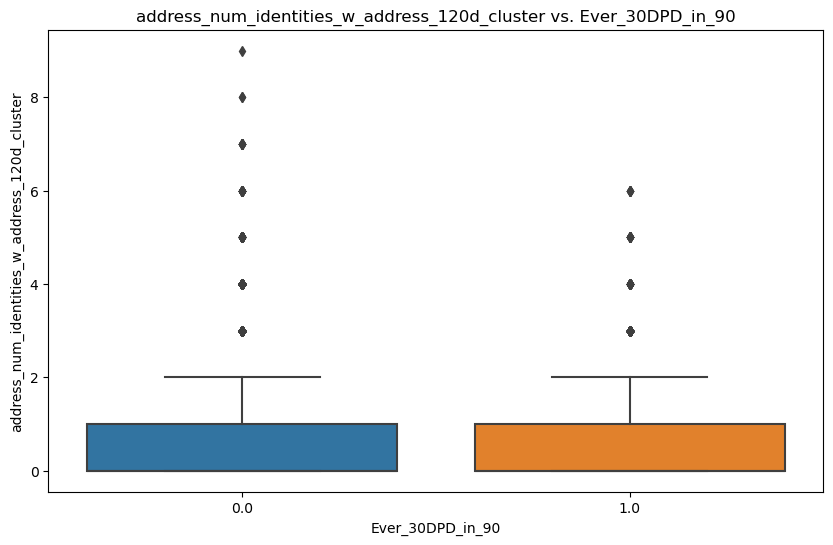

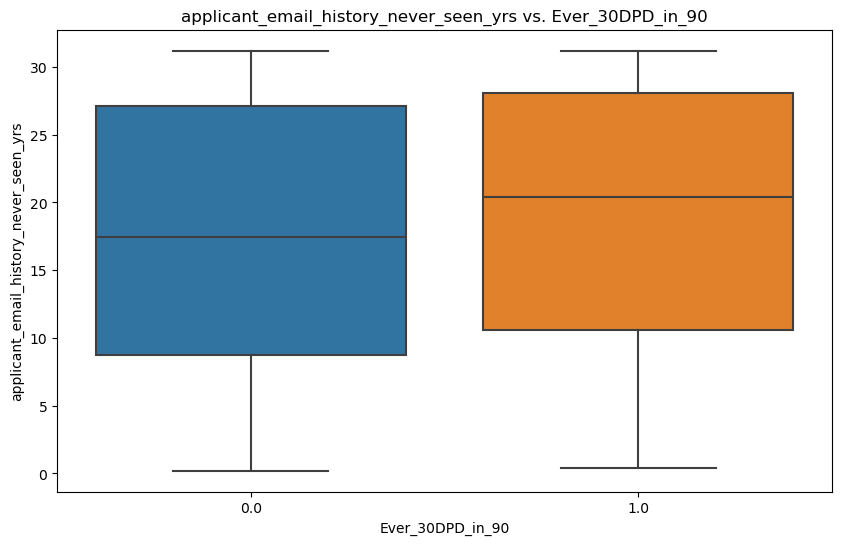

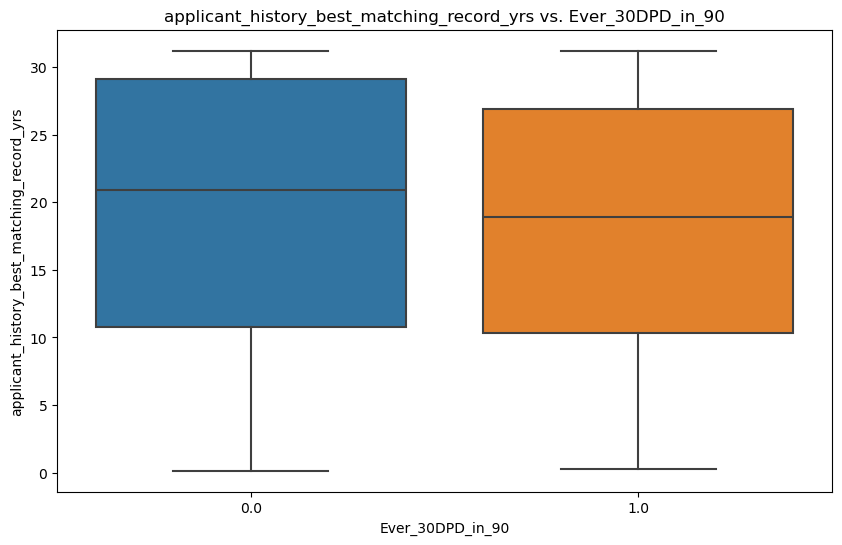

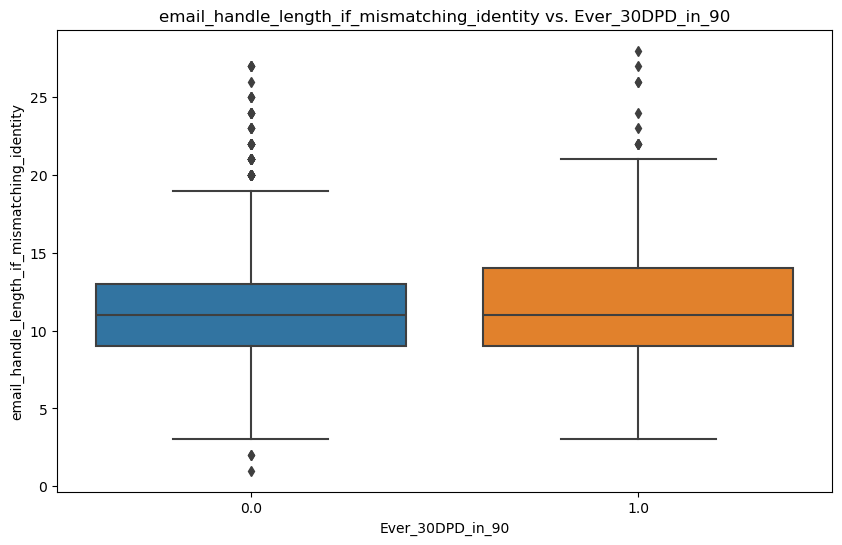

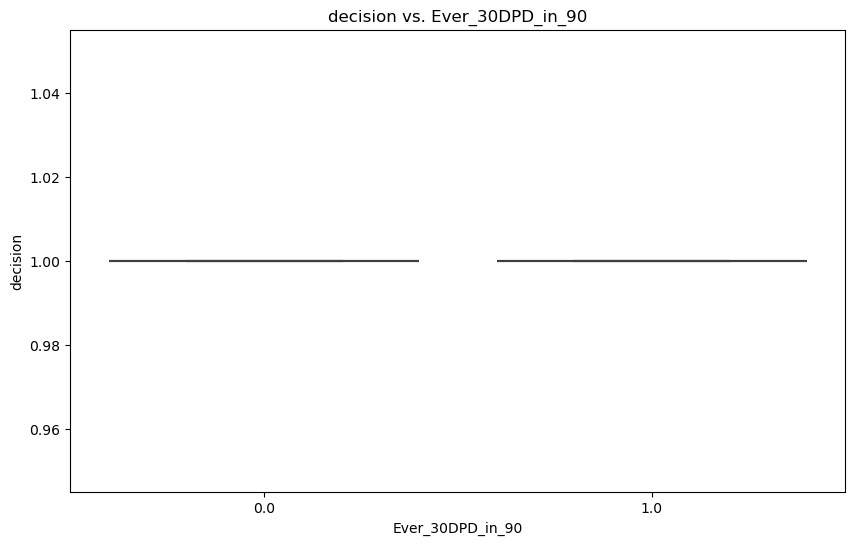

In [36]:
import seaborn as sns

def plot_relationships(data, target, features):
    for feature in features:
        plt.figure(figsize=(10, 6))
        if data[feature].dtype in ['int64', 'float64']:
            sns.boxplot(x=data[target], y=data[feature])
            plt.title(f'{feature} vs. {target}')
            plt.xlabel(target)
            plt.ylabel(feature)
        else: 
            sns.countplot(x=data[feature], hue=data[target])
            plt.title(f'{feature} vs. {target}')
            plt.xlabel(feature)
            plt.ylabel('Count')
        plt.show()

plot_relationships(final_df, 'Ever_30DPD_in_90', numeric_columns)

# 3. Feature Importance

## 3.1 Ever_30DPD_in_90 feature 

In [37]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

data_clean = final_df.dropna(subset=['Ever_30DPD_in_90'])
numeric_features = data_clean.select_dtypes(include=[np.number]).columns.drop('Ever_30DPD_in_90')
numeric_data = data_clean[numeric_features].dropna(axis=1, how='all')

X = numeric_data
y = data_clean['Ever_30DPD_in_90']
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
X_imputed_df = pd.DataFrame(X_imputed, columns=X.columns)

In [38]:
correlation_matrix = X_imputed_df.corr(numeric_only=True)
correlation_matrix['Ever_30DPD_in_90'] = data_clean['Ever_30DPD_in_90']
target_correlations = correlation_matrix['Ever_30DPD_in_90'].dropna().sort_values(ascending=False)

X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [39]:
feature_importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
missing_values = final_df.isnull().sum().sort_values(ascending=False)

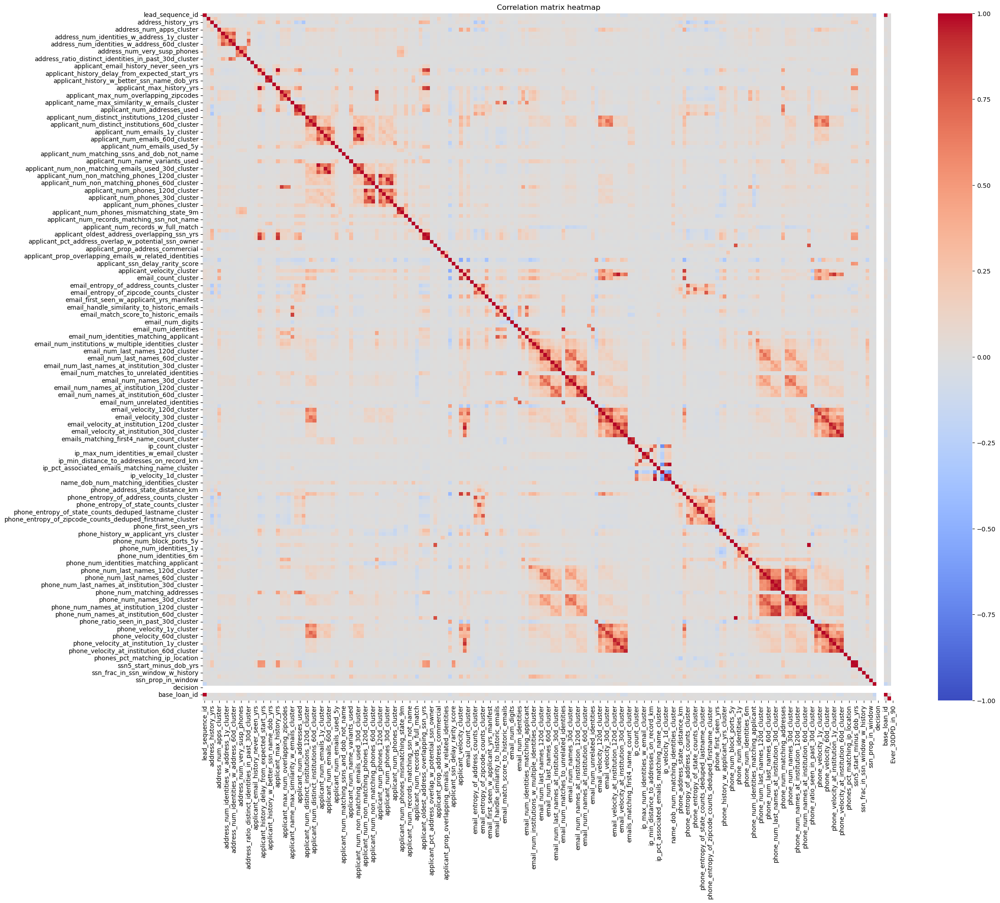

In [40]:
plt.figure(figsize=(25, 20))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation matrix heatmap')
plt.show()

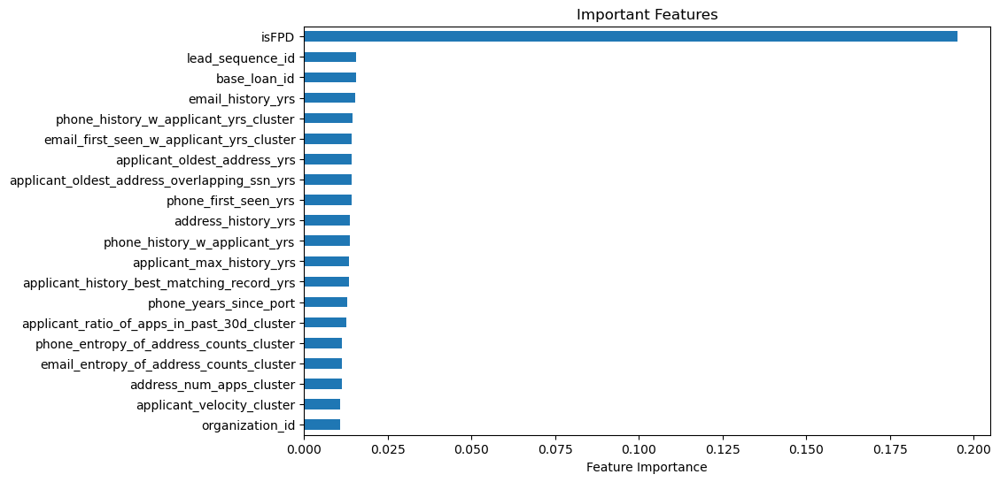

In [41]:
plt.figure(figsize=(10, 6))
feature_importances.head(20).plot(kind='barh')
plt.title('Important Features')
plt.xlabel('Feature Importance')
plt.gca().invert_yaxis()
plt.show()

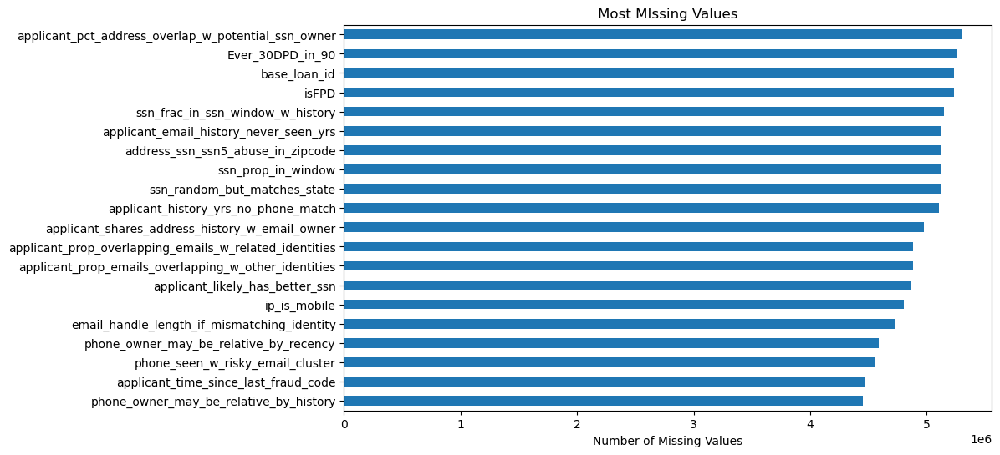

In [42]:
plt.figure(figsize=(10, 6))
missing_values.head(20).plot(kind='barh')
plt.title('Most MIssing Values')
plt.xlabel('Number of Missing Values')
plt.gca().invert_yaxis()
plt.show()
### out of 5310065

In [43]:
top_60_importances = feature_importances.head(60).to_frame(name='Importance')
top_20_missing_values = missing_values.head(20).to_frame(name='Missing Values')

In [44]:
(top_60_importances, top_20_missing_values)

(                                                  Importance
 isFPD                                               0.195276
 lead_sequence_id                                    0.015671
 base_loan_id                                        0.015466
 email_history_yrs                                   0.015382
 phone_history_w_applicant_yrs_cluster               0.014540
 email_first_seen_w_applicant_yrs_cluster            0.014244
 applicant_oldest_address_yrs                        0.014221
 applicant_oldest_address_overlapping_ssn_yrs        0.014196
 phone_first_seen_yrs                                0.014139
 address_history_yrs                                 0.013819
 phone_history_w_applicant_yrs                       0.013576
 applicant_max_history_yrs                           0.013366
 applicant_history_best_matching_record_yrs          0.013363
 phone_years_since_port                              0.012785
 applicant_ratio_of_apps_in_past_30d_cluster         0.012639
 phone_e

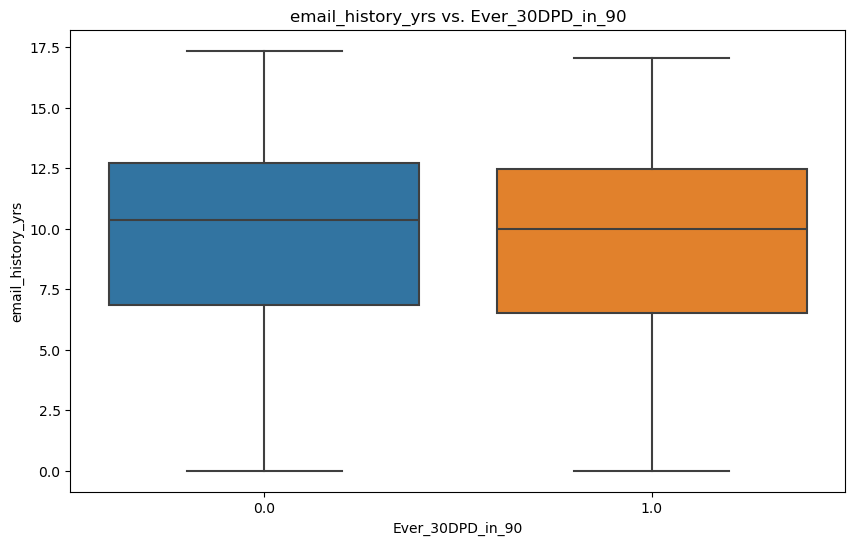

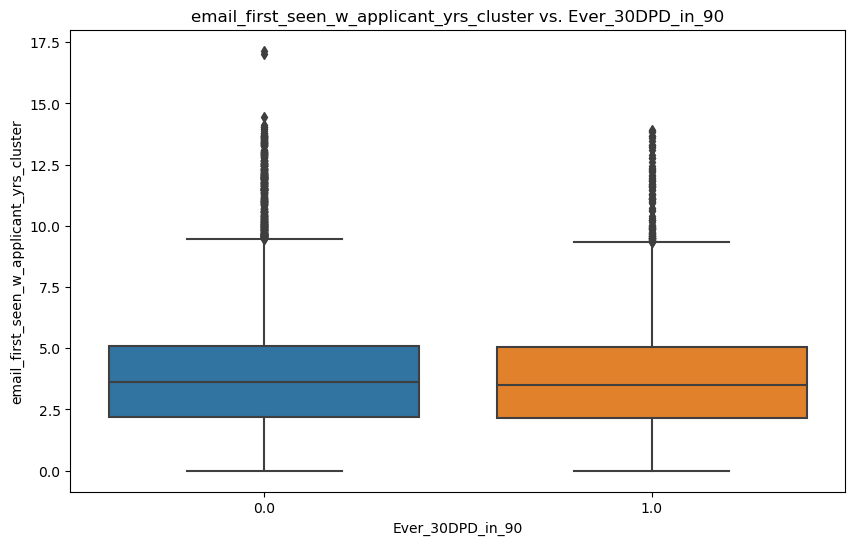

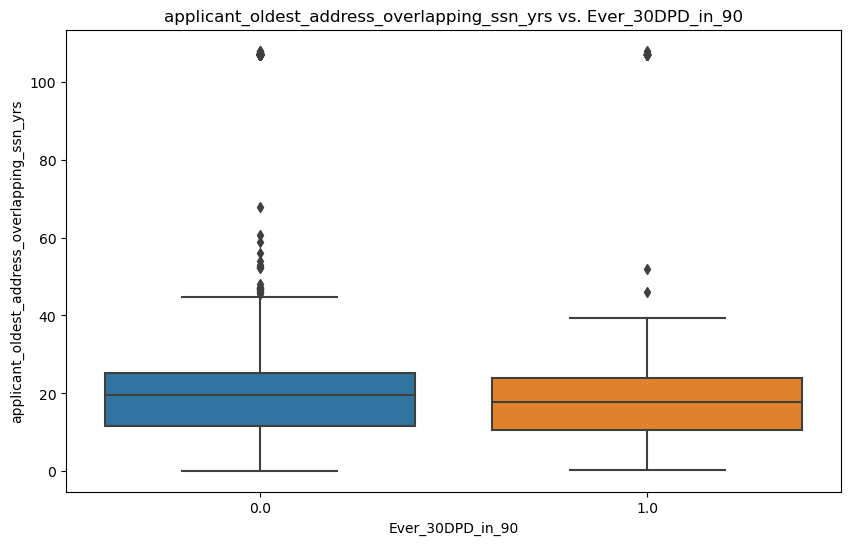

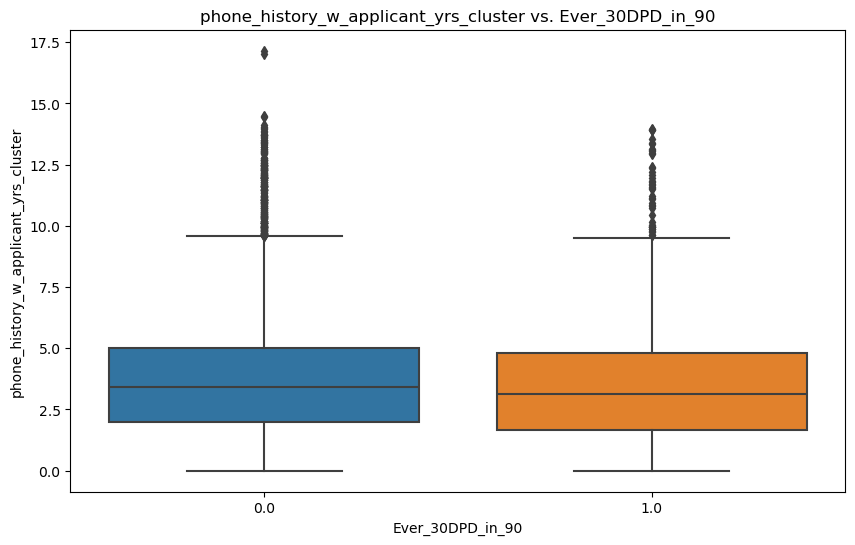

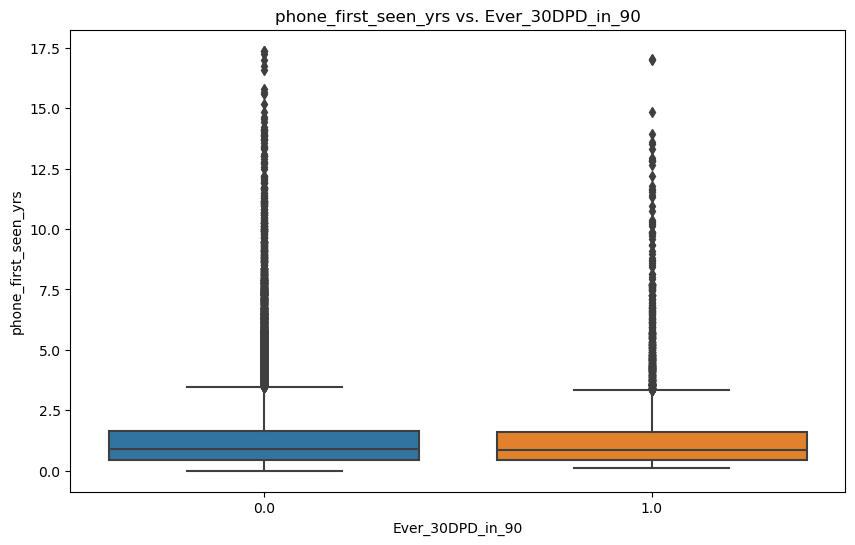

...

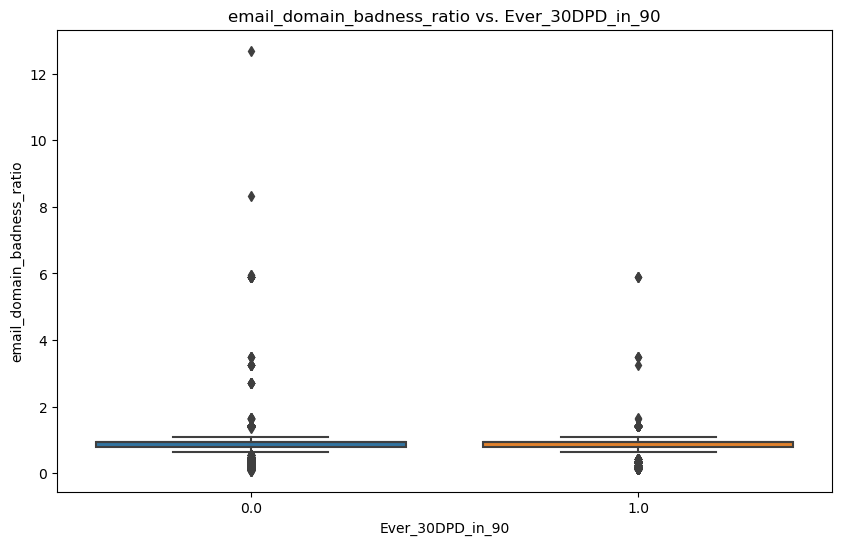

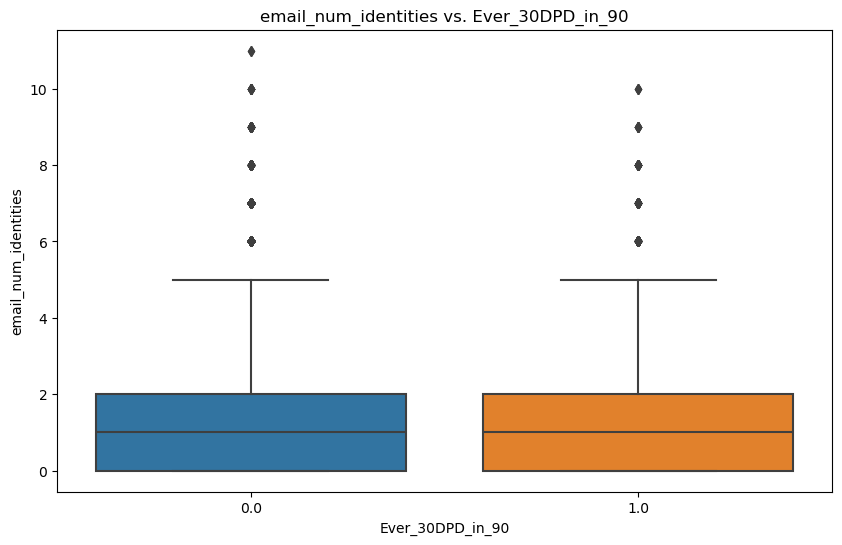

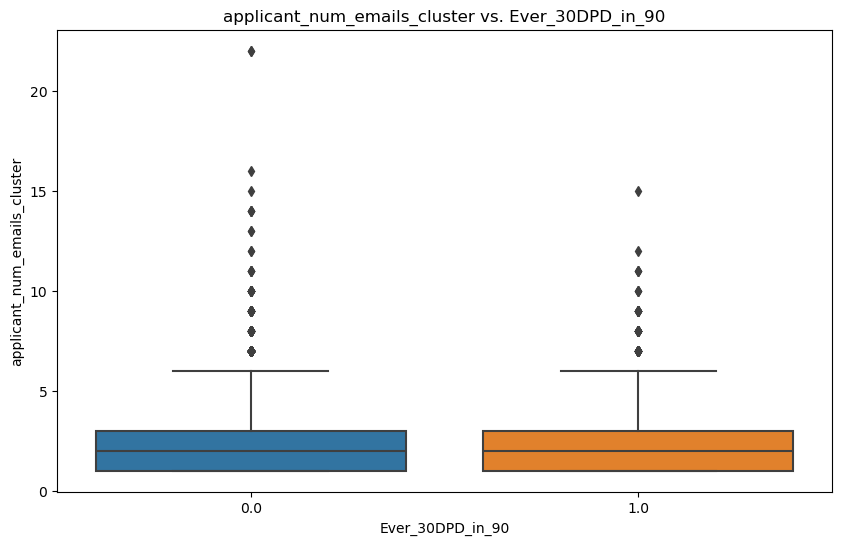

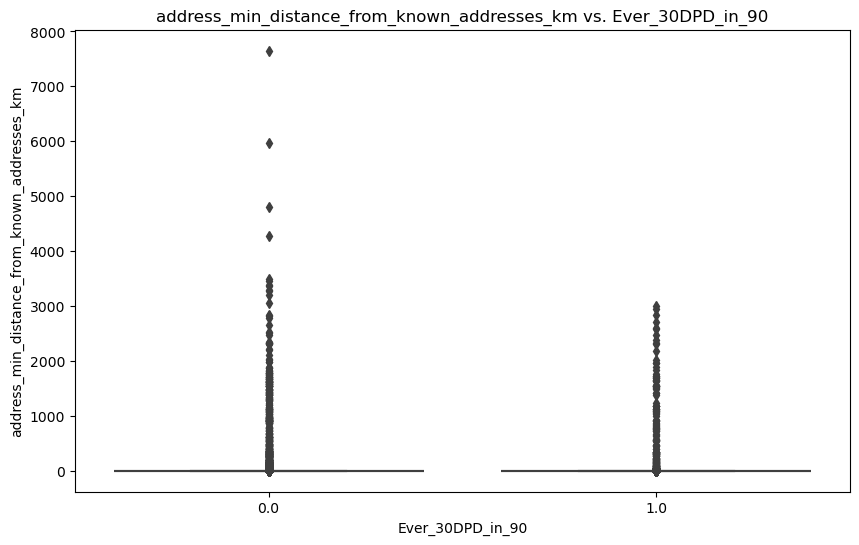

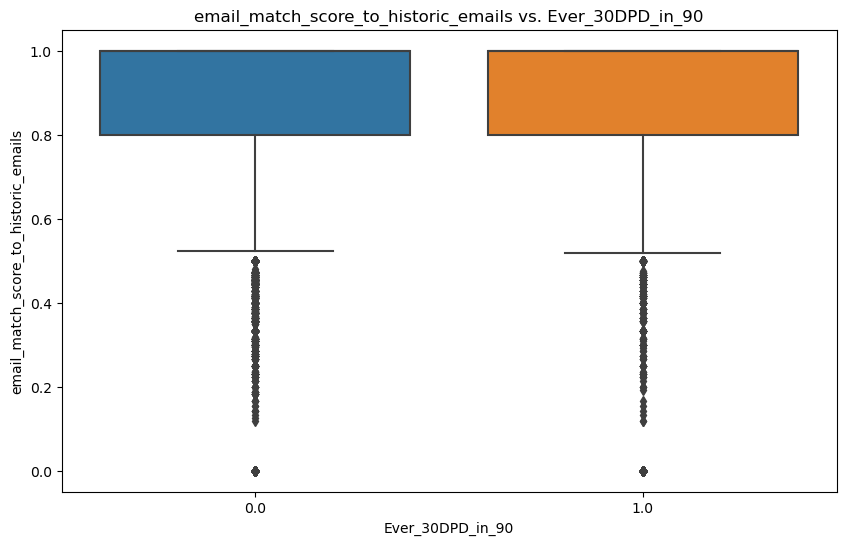

In [45]:

important_columns = [
 'email_history_yrs'                                   ,  
 'email_first_seen_w_applicant_yrs_cluster'            ,
 'applicant_oldest_address_overlapping_ssn_yrs'        ,
 'phone_history_w_applicant_yrs_cluster'               ,
 'phone_first_seen_yrs'                                ,
 'phone_history_w_applicant_yrs'                       ,
 'address_history_yrs'                                 ,
 'applicant_oldest_address_yrs'                        ,
 'applicant_max_history_yrs'                           ,
 'applicant_history_best_matching_record_yrs'          ,
 'applicant_ratio_of_apps_in_past_30d_cluster'         ,
 'phone_years_since_port'                              ,
 'email_entropy_of_address_counts_cluster'             ,
 'address_num_apps_cluster'                            ,
 'phone_entropy_of_address_counts_cluster'             ,
 'applicant_velocity_cluster'                          ,
 'phone_num_matching_addresses'                        ,
 'phone_count_cluster'                                 ,
 'applicant_history_delay_from_expected_start_yrs'     ,
 'email_count_cluster'                                 ,
 'applicant_num_addresses_overlapping_ssn'             ,
 'email_entropy_of_zipcode_counts_cluster'             ,
 'applicant_num_addresses_used'                        ,
 'applicant_ssn_delay_rarity_score'                    ,
 'phone_entropy_of_zipcode_counts_cluster'             ,
 'email_first_seen_w_applicant_yrs_manifest'           ,
 'applicant_num_emails_used_5y'                        ,
 'ssn5_end_minus_dob_yrs'                              ,
 'address_distance_from_most_recent_on_record_km'      ,
 'phone_velocity_1y_cluster'                           ,
 'email_velocity_1y_cluster'                           ,
 'applicant_num_addresses_used_5y'                     ,
 'ssn5_start_minus_dob_yrs'                            ,
 'applicant_num_records_w_partial_match'               ,
 'ssn_address_state_mismatch_score'                    ,
 'applicant_num_phones_used_5y'                        ,
 'ip_min_distance_to_addresses_on_record_km'           ,
 'ip_distance_from_address_km'                         ,
 'phone_num_identities'                                ,
 'phone_num_unrelated_identities'                      ,
 'email_num_digits'                                    ,
 'email_ratio_seen_in_past_30d_cluster'                ,
 'address_num_identities_w_address_1y_cluster'         ,
 'applicant_num_phones_cluster'                        ,
 'phone_velocity_120d_cluster'                         ,
 'email_handle_similarity_to_historic_emails'          ,
 'applicant_time_since_last_fraud_code'                ,
 'applicant_prop_address_commercial'                   ,
 'applicant_num_name_variants_used'                    ,
 'applicant_num_distinct_institutions_120d_cluster'    ,
 'phone_ratio_seen_in_past_30d_cluster'                ,
 'email_velocity_120d_cluster'                         ,
 'email_domain_badness_ratio'                          ,
 'email_num_identities'                                ,
 'applicant_num_emails_cluster'                        ,
 'address_min_distance_from_known_addresses_km'        ,
 'email_match_score_to_historic_emails'                
]

plot_relationships(final_df, 'Ever_30DPD_in_90', important_columns)

In [46]:
dpd_features = ['email_history_yrs',
                'email_first_seen_w_applicant_yrs_cluster',
                'applicant_oldest_address_overlapping_ssn_yrs',
                'phone_history_w_applicant_yrs_cluster',
                'phone_history_w_applicant_yrs',
                'address_history_yrs',
                'applicant_oldest_address_yrs',
                'applicant_max_history_yrs',
                'applicant_history_best_matching_record_yrs',
                'phone_years_since_port',
                'email_entropy_of_address_counts_cluster',
                'phone_entropy_of_address_counts_cluster',
                'applicant_history_delay_from_expected_start_yrs',
                'email_entropy_of_zipcode_counts_cluster',
                'phone_entropy_of_zipcode_counts_cluster',
                'ssn5_end_minus_dob_yrs',
                'applicant_num_addresses_used_5y',
                'ssn5_start_minus_dob_yrs',
                'applicant_num_phones_used_5y',
                'address_num_identities_w_address_1y_cluster',
                'applicant_num_phones_cluster',
                'applicant_time_since_last_fraud_code',
                'applicant_num_distinct_institutions_120d_cluster',
                'applicant_num_emails_cluster',
                'address_min_distance_from_known_addresses_km'
               ]

In [ ]:
def create_unique_bins(feature_data, target_data, initial_bins=10):
    bins = initial_bins
    while bins > 1:
        bin_edges = np.histogram_bin_edges(feature_data.dropna(), bins=bins)
        if len(bin_edges) == len(set(bin_edges)):
            break
        bins -= 1
    bin_labels = pd.cut(feature_data, bins=bin_edges, include_lowest=True, labels=range(len(bin_edges)-1))
    bin_means = target_data.groupby(bin_labels).mean()
    return bin_edges, bin_means

def plot_feature_buckets(data, target_col, features):
    for feature in features:
        feature_data = data[feature]
        target_data = data[target_col]
        bin_edges, bin_means = create_unique_bins(feature_data, target_data)
        plt.figure(figsize=(10, 6))
        plt.bar(range(len(bin_means)), bin_means, tick_label=[f'{bin_edges[i]:.2f}-{bin_edges[i+1]:.2f}' for i in
                                                             range(len(bin_edges)-1)])
        plt.xlabel(f'{feature} Bins')
        plt.ylabel(f'Mean {target_col}')
        plt.title(f'{feature} vs. Mean {target_col}')
        plt.xticks(rotation=45)
        plt.show()

In [ ]:
def decile_buckets(df, icolumns, fpd_column, dpd_column):
    for column in icolumns:
        df['decile'] = pd.qcut(df[column].rank(method='first'), 10, labels=False) + 1
        stats = df.groupby(['decile', fpd_column])[column].agg(['count']).reset_index()
        stats_pivot = stats.pivot(index='decile', columns=fpd_column, values=['count']).reset_index()
        stats_pivot.columns = ['decile', 'count_0', 'count_1']
        stats_pivot.fillna({'count_0': 0, 'count_1': 0}, inplace=True)
        stats_pivot['total'] = stats_pivot['count_0'] + stats_pivot['count_1']
        stats_pivot['default_rate'] = stats_pivot['count_1'] / stats_pivot['total'] * 100
        stats_interval = df.groupby('decile')[column].agg(['min', 'max']).reset_index()
        result = pd.merge(stats_interval, stats_pivot,  on='decile')
        dpd_stats = df.groupby('decile')[dpd_column].mean().reset_index()
        result = pd.merge(result, dpd_stats, on='decile')
        print(f'{column}')
        print(result)


In [ ]:
feature_buckets = decile_buckets(final_df, dpd_features, 'isFPD', 'Ever_30DPD_in_90')

In [72]:
def decile_buckets(df, icolumns, fpd_column, dpd_column):
    feature_buckets = {}
    for col in icolumns:
        if col not in df.columns:
            continue
        df['decile'] = pd.qcut(df[col].rank(method='first'), 10, labels=False) + 1
        decile_df = df.groupby('decile').agg(
            min_value=(col, 'min'),
            max_value=(col, 'max'),
            default_rate=(fpd_column, 'mean'),
            ever_30dpd=(dpd_column, 'mean')
        ).reset_index()
        decile_df['feature'] = col
        feature_buckets[col] = decile_df
    return feature_buckets

feature_buckets = decile_buckets(final_df, dpd_features, 'isFPD', 'Ever_30DPD_in_90')
print(feature_buckets)


{'email_history_yrs':    decile  min_value  max_value  default_rate  ever_30dpd            feature
0     1.0   0.000000   2.015058      0.103088    0.169387  email_history_yrs
1     2.0   2.015058   3.868583      0.092240    0.139625  email_history_yrs
2     3.0   3.868583   5.508556      0.091711    0.148770  email_history_yrs
3     4.0   5.508556   6.956879      0.088687    0.134512  email_history_yrs
4     5.0   6.956879   8.232717      0.091287    0.141894  email_history_yrs
5     6.0   8.232717  10.036961      0.087271    0.145012  email_history_yrs
6     7.0  10.036961  11.060917      0.075453    0.128338  email_history_yrs
7     8.0  11.060917  12.531143      0.083383    0.139051  email_history_yrs
8     9.0  12.531143  14.206708      0.078556    0.128093  email_history_yrs
9    10.0  14.206708  17.538672      0.073407    0.112375  email_history_yrs, 'email_first_seen_w_applicant_yrs_cluster':    decile  min_value    max_value  default_rate  ever_30dpd  \
0     1.0   0.000000   

In [48]:
import openpyxl
from openpyxl.drawing.image import Image 
import os

def write_to_excel_with_graphs(feature_buckets, output_file):
    with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
        sheet_index = 0
        
        for feature, df in feature_buckets.items():
            sheet_name = f'Features {sheet_index // 5 + 1}'
            startrow = (sheet_index % 5) * 15
            df.to_excel(writer, sheet_name=sheet_name, index=False, startrow=startrow)
            
            plt.figure(figsize=(8, 6))
            plt.bar(df['decile'], df['ever_30dpd'])
            plt.xlabel('Decile')
            plt.ylabel('Ever_30dpd_in_90')
            
            image_path = f'{feature}.png'
            plt.savefig(image_path)
            plt.close()
            workbook = writer.book
            worksheet = workbook[sheet_name]
            img = openpyxl.drawing.image.Image(image_path)
            img.anchor = f'I{startrow + 1}'
            worksheet.add_image(img)
            sheet_index += 1
            
    for feature in feature_buckets.keys():
        os.remove(f'{feature}.png')

In [49]:
output_file = 'feature_buckets.xlsx'
write_to_excel_with_graphs(feature_buckets, output_file)

## Graph features that show the best trends relating to dpd/fpd
### Look at isoriginated and do the same as for dpd/fpd
#### Check features against TUrs/mkscore and see if the features within Sentilink offer anything suggestive for defaults

## 3.2 isOrigination 

In [50]:
columns_drop_2 = ['isFPD', 'base_loan_id', 'Ever_30DPD_in_90', 'decision', 'lead_sequence_id']
final_df_iso = final_df.drop(columns=columns_drop_2)

In [51]:
final_df_iso

,address_city_matches_records,address_distance_from_most_recent_on_record_km,address_history_yrs,address_min_distance_from_known_addresses_km,address_num_apps_cluster,address_num_identities_w_address_120d_cluster,address_num_identities_w_address_1y_cluster,address_num_identities_w_address_30d_cluster,address_num_identities_w_address_60d_cluster,address_num_susp_phones,...,ssn_frac_in_ssn_window_w_history,ssn_may_belong_to_a_minor,ssn_num_identities_cluster,ssn_prop_in_window,ssn_random_but_matches_state,zipcode_first_3_matches_manifest,zipcode_matches_manifest,organization_id,isorigination,decile
0,True,26.392402,NaN,4.046947,2.0,0.0,1.0,0.0,0.0,0.0,...,NaN,False,1.0,NaN,NaN,True,True,1.0,0,10.0
1,True,1.909185,NaN,1.909185,5.0,NaN,NaN,NaN,NaN,0.0,...,NaN,False,6.0,NaN,NaN,True,True,1.0,0,10.0
2,False,2346.063426,NaN,2.054761,36.0,3.0,4.0,0.0,1.0,0.0,...,NaN,False,1.0,NaN,NaN,False,False,3.0,0,10.0
3,True,0.000000,6.535250,0.000000,35.0,2.0,2.0,0.0,1.0,0.0,...,NaN,False,2.0,NaN,NaN,True,True,3.0,0,1.0
4,True,1498.239721,12.788501,0.000000,34.0,0.0,0.0,0.0,0.0,0.0,...,NaN,False,2.0,NaN,NaN,True,True,3.0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5310061,True,0.000000,5.492129,0.000000,11.0,0.0,0.0,0.0,0.0,0.0,...,NaN,False,3.0,NaN,NaN,True,True,2.0,0,9.0
5310062,True,0.000000,7.824778,0.000000,34.0,0.0,0.0,0.0,0.0,0.0,...,NaN,False,5.0,NaN,NaN,True,True,3.0,0,9.0
5310063,True,13.316022,NaN,8.447041,7.0,0.0,0.0,0.0,0.0,0.0,...,NaN,False,1.0,NaN,NaN,True,False,2.0,1,10.0
5310064,True,0.000000,0.076660,0.000000,5.0,0.0,0.0,0.0,0.0,0.0,...,NaN,False,2.0,NaN,NaN,True,True,1.0,0,9.0


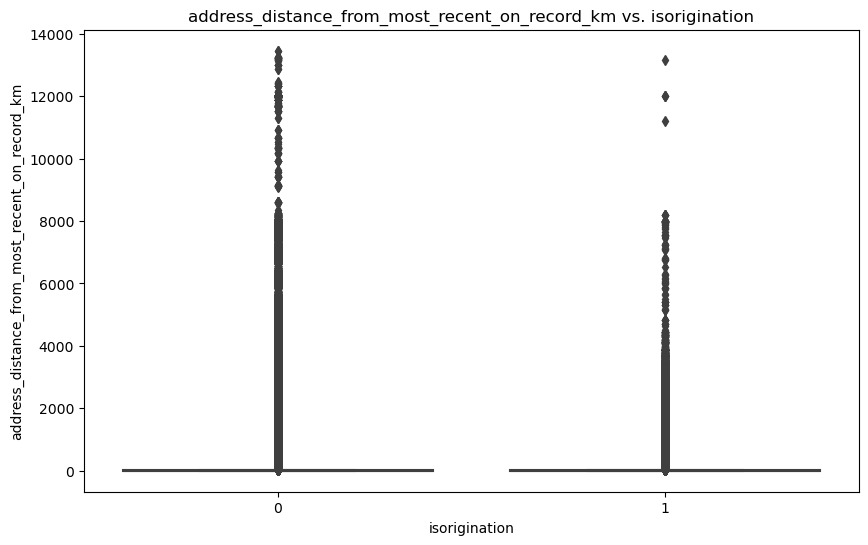

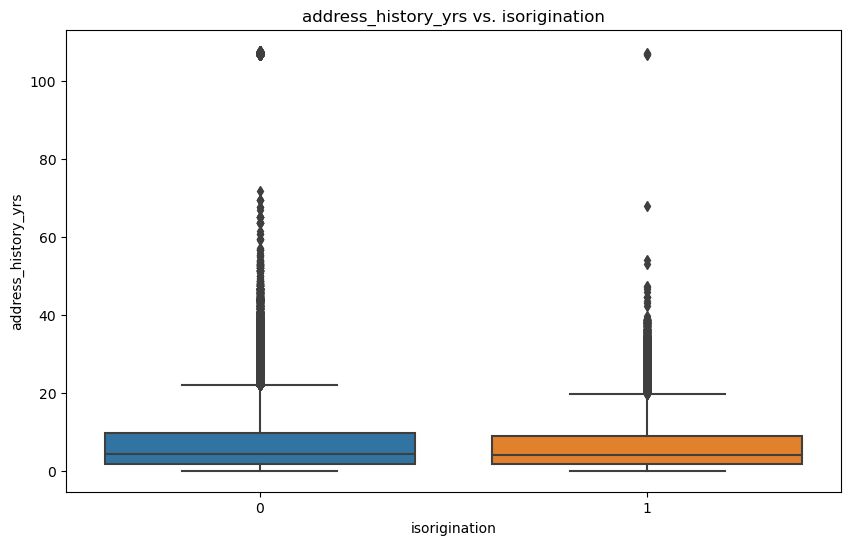

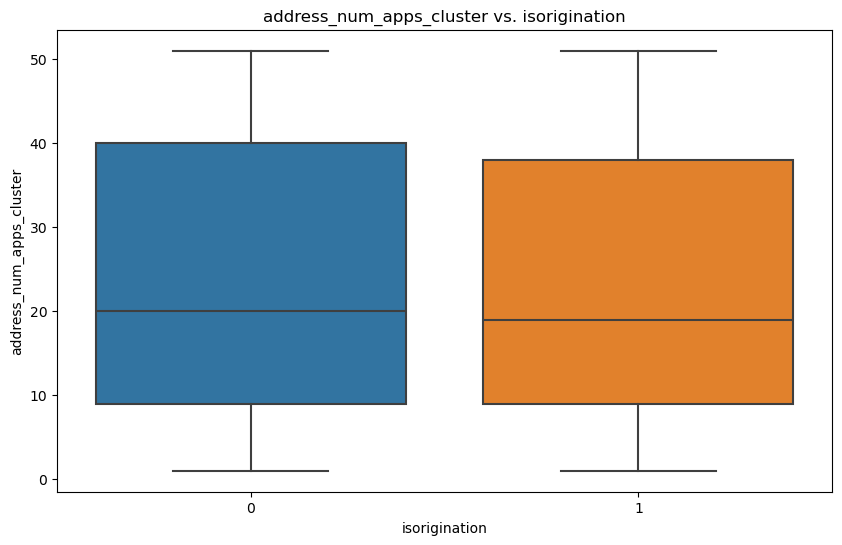

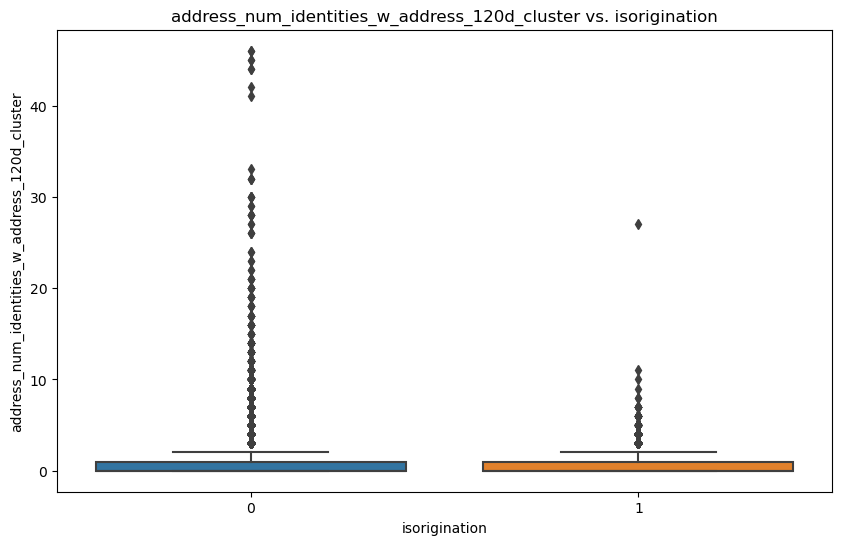

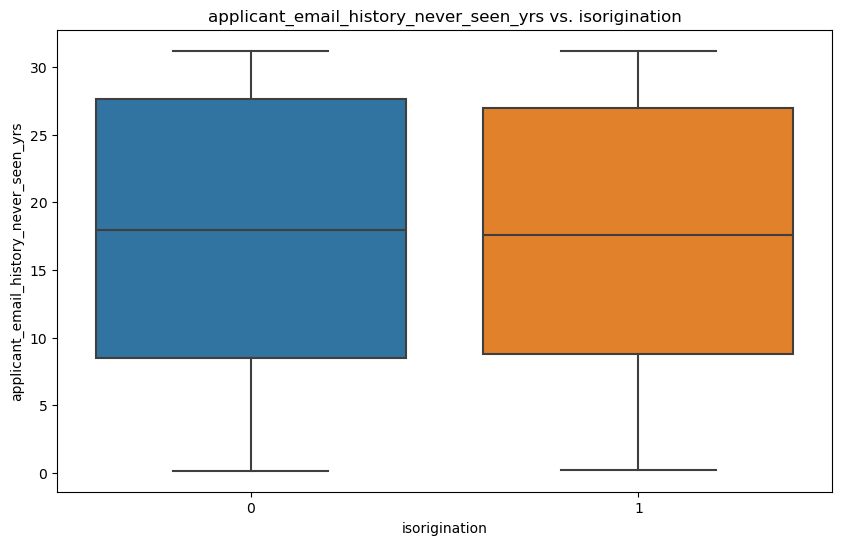

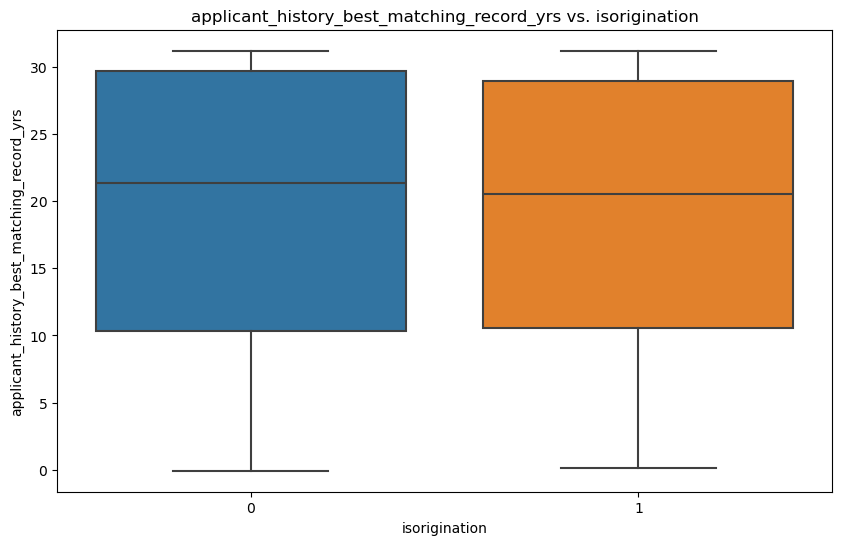

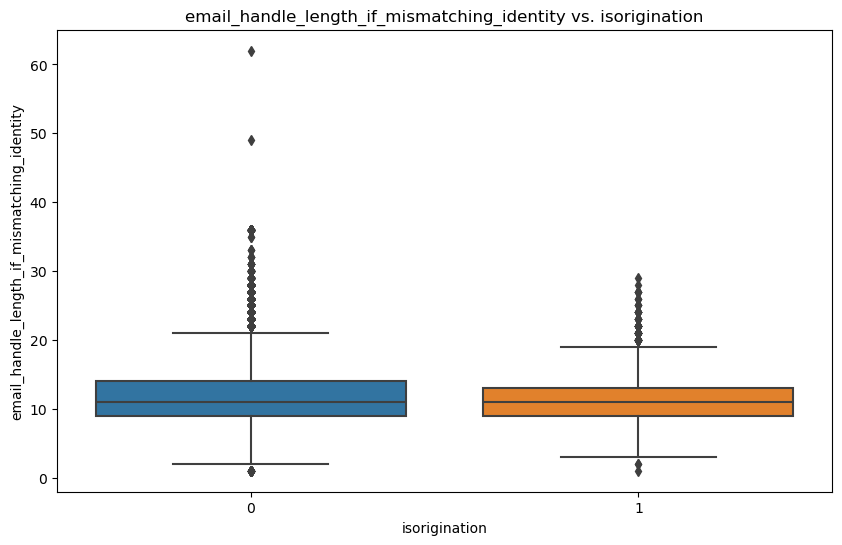

KeyError: 'decision'

<Figure size 1000x600 with 0 Axes>

In [52]:
plot_relationships(final_df_iso, 'isorigination', numeric_columns)

In [53]:
data_clean_iso = final_df_iso.dropna(subset=['isorigination'])
numeric_features = data_clean_iso.select_dtypes(include=[np.number]).columns.drop('isorigination')
numeric_data = data_clean_iso[numeric_features].dropna(axis=1, how='all')

X = numeric_data
y = data_clean_iso['isorigination']
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
X_imputed_df = pd.DataFrame(X_imputed, columns=X.columns)

In [54]:
correlation_matrix = X_imputed_df.corr(numeric_only=True)
correlation_matrix['isorigination'] = data_clean_iso['isorigination']
target_correlations = correlation_matrix['isorigination'].dropna().sort_values(ascending=False)

X_train, X_test, y_train, y_test = train_test_split(X_imputed, y, test_size=0.3, random_state=42)
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [55]:
feature_importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)

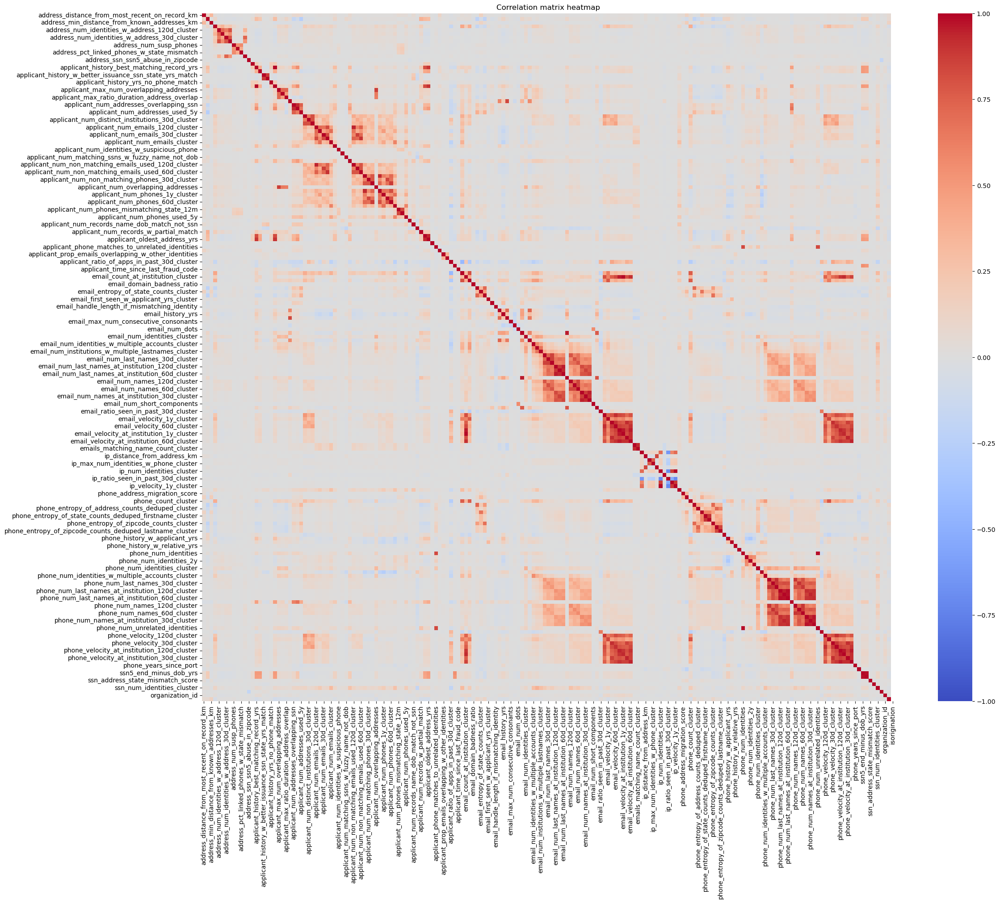

In [56]:
plt.figure(figsize=(25, 20))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation matrix heatmap')
plt.show()

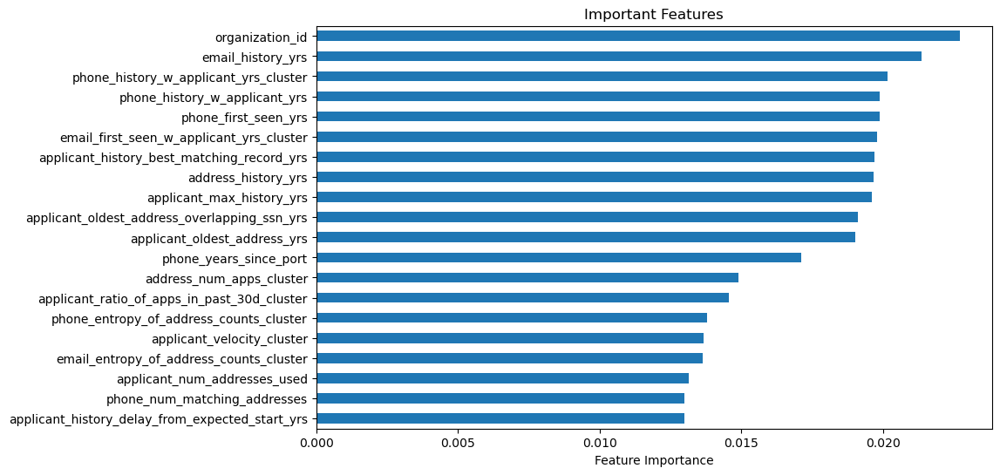

In [57]:
plt.figure(figsize=(10, 6))
feature_importances.head(20).plot(kind='barh')
plt.title('Important Features')
plt.xlabel('Feature Importance')
plt.gca().invert_yaxis()
plt.show()

In [58]:
top_50_importances = feature_importances.head(50).to_frame(name='Importance')
top_50_importances

,Importance
organization_id,0.022698
email_history_yrs,0.021345
phone_history_w_applicant_yrs_cluster,0.020142
phone_history_w_applicant_yrs,0.019867
phone_first_seen_yrs,0.019862
email_first_seen_w_applicant_yrs_cluster,0.019774
applicant_history_best_matching_record_yrs,0.019695
address_history_yrs,0.019674
applicant_max_history_yrs,0.019587
applicant_oldest_address_overlapping_ssn_yrs,0.019118


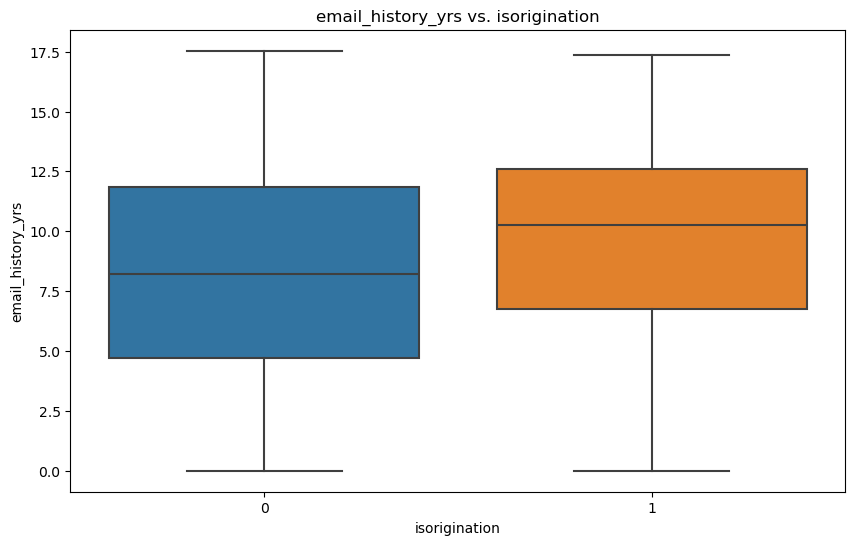

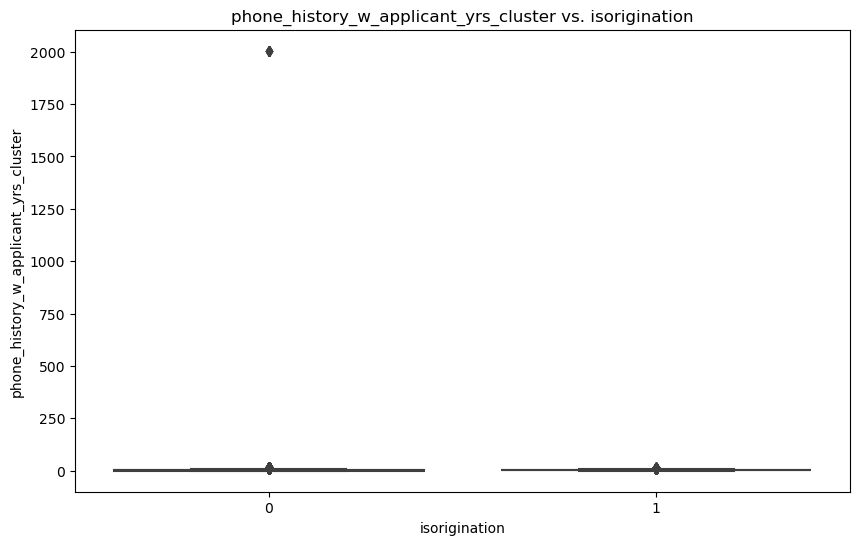

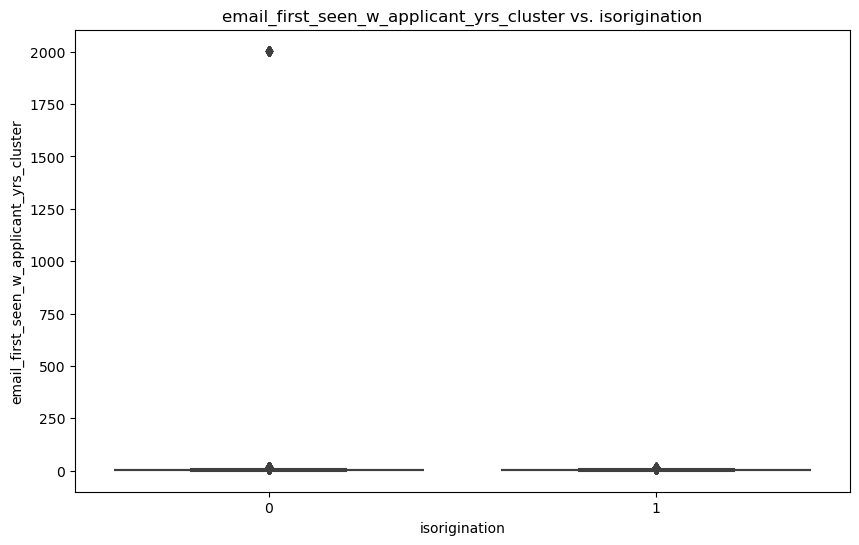

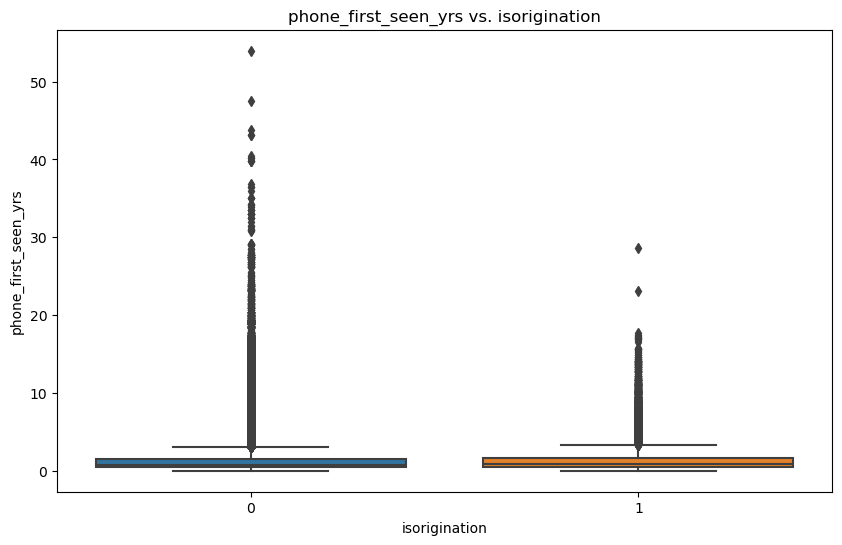

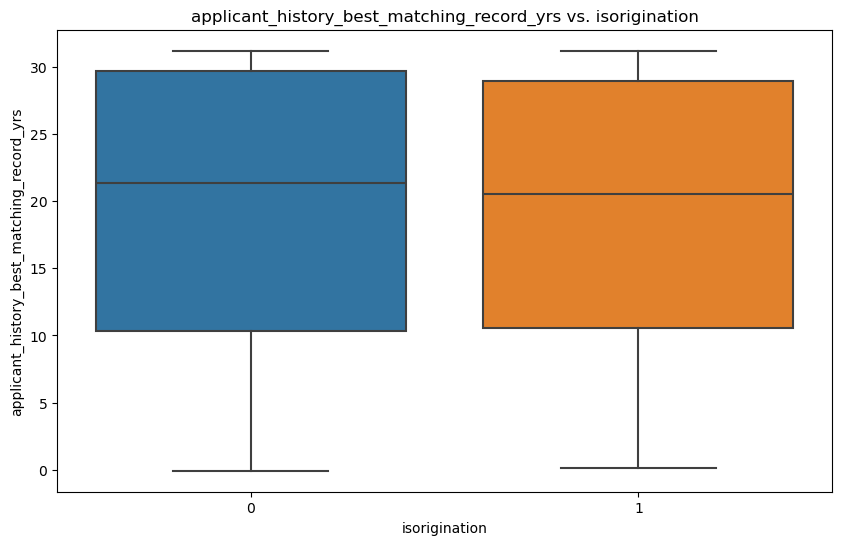

...

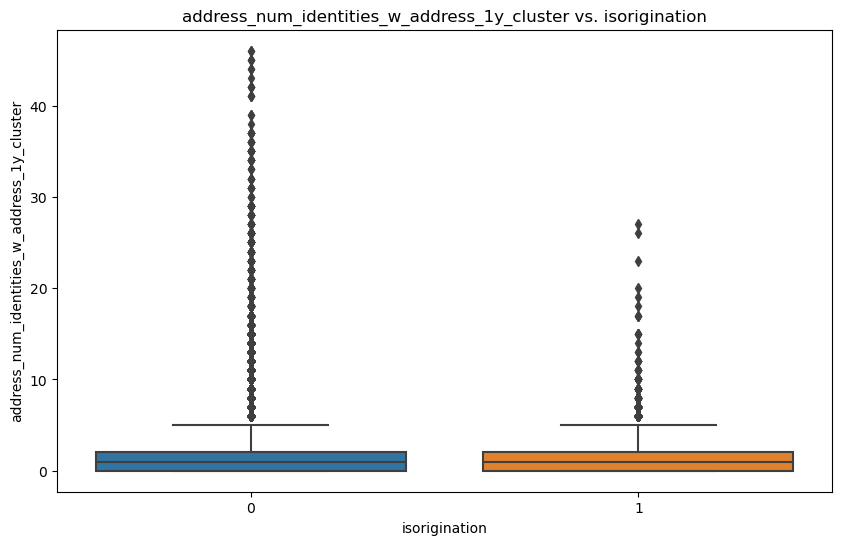

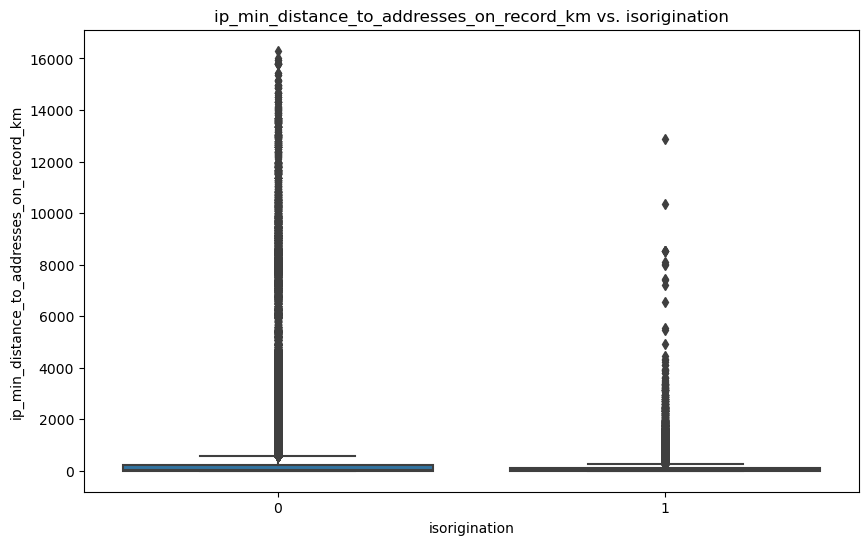

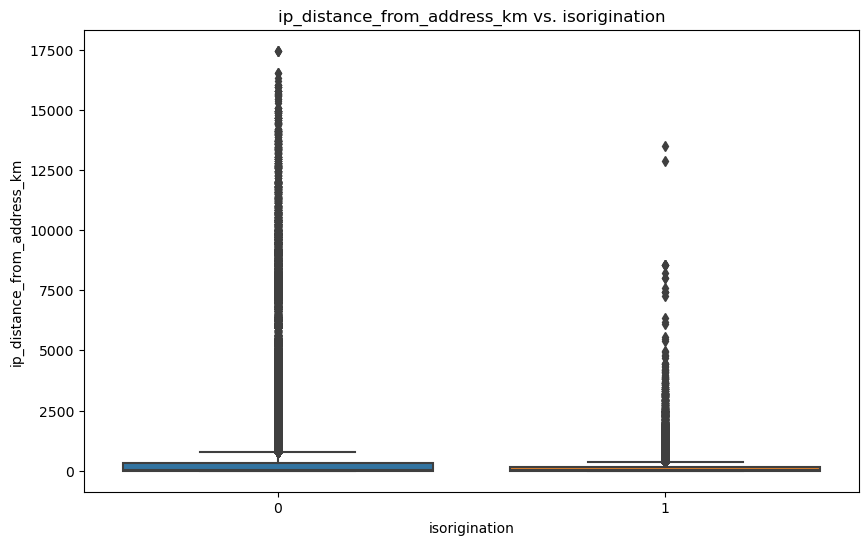

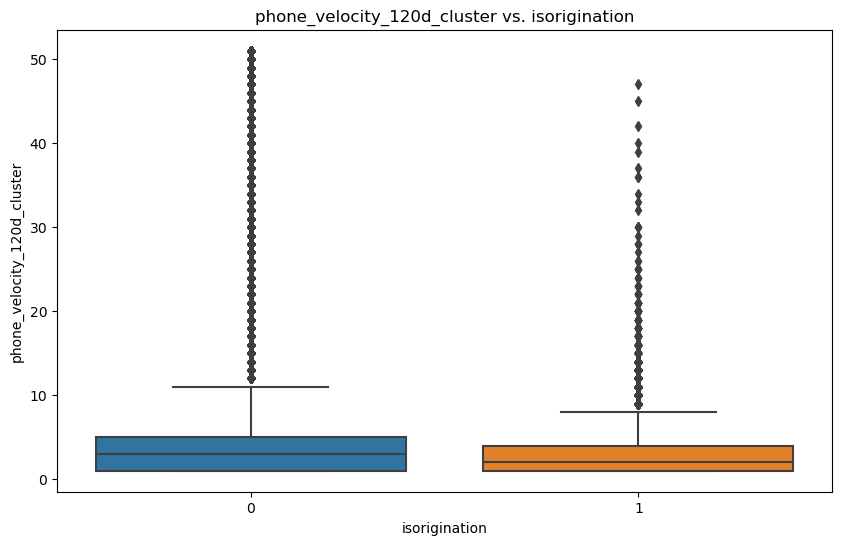

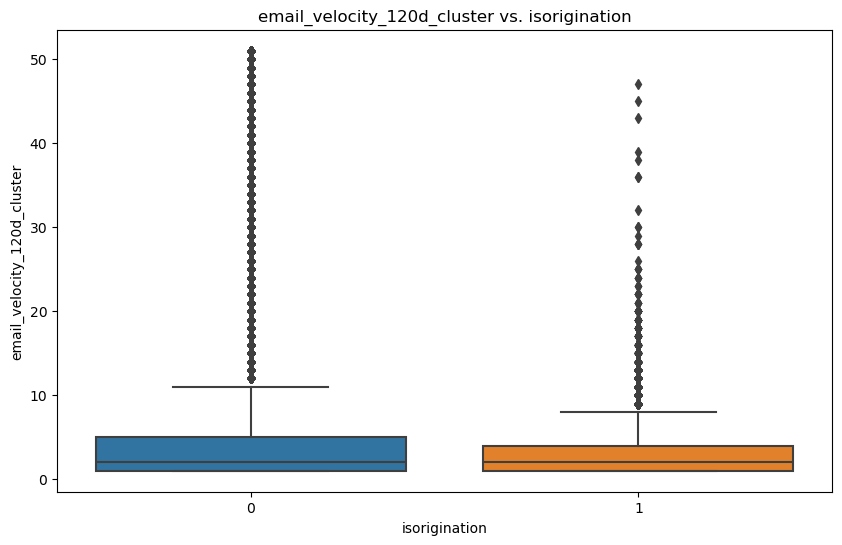

In [59]:
important_columns_iso = [
    'email_history_yrs',
    'phone_history_w_applicant_yrs_cluster',
    'email_first_seen_w_applicant_yrs_cluster',
    'phone_first_seen_yrs',
    'applicant_history_best_matching_record_yrs',
    'applicant_max_history_yrs',
    'phone_history_w_applicant_yrs',
    'address_history_yrs',
    'applicant_oldest_address_overlapping_ssn_yrs',
    'applicant_oldest_address_yrs',
    'phone_years_since_port',
    'address_num_apps_cluster',
    'applicant_ratio_of_apps_in_past_30d_cluster',
    'phone_entropy_of_address_counts_cluster',
    'applicant_velocity_cluster',
    'email_entropy_of_address_counts_cluster',
    'applicant_num_addresses_used',
    'phone_num_matching_addresses',
    'applicant_history_delay_from_expected_start_yrs',
    'phone_count_cluster',
    'email_count_cluster',
    'applicant_num_addresses_overlapping_ssn',
    'applicant_ssn_delay_rarity_score',
    'applicant_num_emails_used_5y',
    'address_distance_from_most_recent_on_record_km',
    'ssn5_end_minus_dob_yrs',
    'applicant_num_records_w_partial_match',
    'email_entropy_of_zipcode_counts_cluster',
    'email_first_seen_w_applicant_yrs_manifest',
    'phone_velocity_1y_cluster',
    'phone_entropy_of_zipcode_counts_cluster',
    'applicant_num_addresses_used_5y',
    'email_velocity_1y_cluster',
    'ssn_address_state_mismatch_score',
    'ssn5_start_minus_dob_yrs',
    'applicant_num_name_variants_used',
    'applicant_time_since_last_fraud_code',
    'email_domain_badness_ratio',
    'email_num_digits',
    'email_max_num_consecutive_consonants',
    'email_handle_similarity_to_historic_emails',
    'phone_num_identities',
    'applicant_num_phones_used_5y',
    'applicant_prop_address_commercial',
    'phone_num_unrelated_identities',
    'address_num_identities_w_address_1y_cluster',
    'ip_min_distance_to_addresses_on_record_km',
    'ip_distance_from_address_km',
    'phone_velocity_120d_cluster',
    'email_velocity_120d_cluster'
]

plot_relationships(final_df_iso, 'isorigination', important_columns_iso)

In [92]:
def iso_decile_buckets(df, icolumns, iso_column):
    feature_buckets = {}
    for col in icolumns:
        if col not in df.columns:
            continue
        try:
            df['decile'] = pd.qcut(df[col], 10, labels=False, duplicates='drop') + 1
            decile_df = df.groupby('decile').agg(
                min_value=(col, 'min'),
                max_value=(col, 'max'),
                isorigination_rate=(iso_column, 'mean')
            ).reset_index()
            decile_df['feature'] = col
            print(f"Decile DataFrame for {col}:\n{decile_df}")
            feature_buckets[col] = decile_df
        except Exception as e:
            print(f"Error processing {col}: e")
    return feature_buckets

In [ ]:
feature_buckets_iso = iso_decile_buckets(final_df_iso, important_columns_iso, 'isorigination')
print(feature_buckets_iso)

In [76]:
iso_features = [
    'email_history_yrs',
    'phone_history_w_applicant_yrs_cluster',
    'email_first_seen_w_applicant_yrs_cluster',
    'phone_history_w_applicant_yrs',
    'applicant_ratio_of_apps_in_past_30d_cluster',
    'applicant_time_since_last_fraud_code',
    'phone_years_since_port',
    'applicant_num_phones_used_5y',
    'ip_min_distance_to_addresses_on_record_km',
    'ip_distance_from_address_km',
    
]
len(iso_features)

10

In [93]:
feature_buckets_iso2 = iso_decile_buckets(final_df, iso_features, 'isorigination')
print(feature_buckets_iso2)

Decile DataFrame for email_history_yrs:
   decile  min_value  max_value  isorigination_rate            feature
0     1.0   0.000000   2.015058            0.004609  email_history_yrs
1     2.0   2.017796   3.868583            0.008221  email_history_yrs
2     3.0   3.871321   5.508556            0.010823  email_history_yrs
3     4.0   5.511294   6.956879            0.013458  email_history_yrs
4     5.0   6.959617   8.232717            0.014753  email_history_yrs
5     6.0   8.235455  10.036961            0.016092  email_history_yrs
6     7.0  10.039699  11.060917            0.017597  email_history_yrs
7     8.0  11.063655  12.531143            0.019122  email_history_yrs
8     9.0  12.533881  14.206708            0.018368  email_history_yrs
9    10.0  14.209446  17.538672            0.018430  email_history_yrs
Decile DataFrame for phone_history_w_applicant_yrs_cluster:
   decile  min_value    max_value  isorigination_rate  \
0     1.0   0.000000     0.473648            0.006385   
1    

Decile DataFrame for ip_distance_from_address_km:
   decile    min_value     max_value  isorigination_rate  \
0     1.0     0.002225      2.000933            0.026894   
1     2.0     2.000939      5.201159            0.027001   
2     3.0     5.201217     10.375207            0.026630   
3     4.0    10.375212     20.978127            0.026108   
4     5.0    20.978493     45.544359            0.024870   
5     6.0    45.544486    113.559531            0.022523   
6     7.0   113.561983    231.113123            0.019036   
7     8.0   231.114210    425.831444            0.016202   
8     9.0   425.832286   1056.349968            0.014641   
9    10.0  1056.350515  17451.115871            0.008808   

                       feature  
0  ip_distance_from_address_km  
1  ip_distance_from_address_km  
2  ip_distance_from_address_km  
3  ip_distance_from_address_km  
4  ip_distance_from_address_km  
5  ip_distance_from_address_km  
6  ip_distance_from_address_km  
7  ip_distance_from_addre

In [94]:
import openpyxl
from openpyxl.drawing.image import Image 
import os

def iso_write_to_excel_with_graphs(feature_buckets_iso2, iso_output_file):
    with pd.ExcelWriter(iso_output_file, engine='openpyxl') as writer:
        sheet_index = 0
        
        for feature, df in feature_buckets_iso2.items():
            sheet_name = f'Features {sheet_index // 5 + 1}'
            startrow = (sheet_index % 5) * 15
            df.to_excel(writer, sheet_name=sheet_name, index=False, startrow=startrow)
            
            plt.figure(figsize=(8, 6))
            plt.bar(df['decile'], df['isorigination_rate'])
            plt.xlabel('Decile')
            plt.ylabel('isOrigination')
            
            image_path = f'{feature}.png'
            plt.savefig(image_path)
            plt.close()
            workbook = writer.book
            worksheet = workbook[sheet_name]
            img = openpyxl.drawing.image.Image(image_path)
            img.anchor = f'I{startrow + 1}'
            worksheet.add_image(img)
            sheet_index += 1
            
    for feature in feature_buckets_iso2.keys():
        os.remove(f'{feature}.png')

In [95]:
iso_output_file = 'feature_buckets_iso2.xlsx'
iso_write_to_excel_with_graphs(feature_buckets_iso2, iso_output_file)

## 3.3 Grouping by org (1-4) 

In [96]:
def process_and_write_excel(df, iso_features, dpd_features, output_file):
    with pd.ExcelWriter(output_file, engine='openpyxl') as writer:
        for org_id in range(1, 5):
            org_df = df[df['organization_id'] == org_id]
            
            feature_buckets_iso = iso_decile_buckets(org_df, iso_features, 'isorigination')
            featue_buckets_dpd = decile_buckets(org_df, dpd_features, 'isFPD', 'Ever_30DPD_in_90')
            
            sheet_name = f'Organization {org_id}'
            row_index = 0
            
            for feature, df_bucket in feature_buckets_iso.items():
                df_bucket.to_excel(writer, sheet_name=sheet_name, index=False, startrow=row_index)
                plt.figure(figsize=(8, 6))
                assert 'isorigination_rate' in df_bucket.columns, f"isorigination_rate not in df_bucket for {feature}"
                plt.bar(df['decile'], df['isorigination_rate'])
                plt.xlabel('Decile')
                plt.ylabel('isOrigination')
                image_path = f'{feature}_org{org_id}.png'
                plt.savefig(image_path)
                plt.close()
                workbook = writer.book
                worksheet = workbook[sheet_name]
                img = openpyxl.drawing.image.Image(image_path)
                img.anchor = f'I{row_index + 1}'
                worksheet.add_image(img)
                row_index += len(df_bucket) + 3
            
            for feature, df_bucket in feature_buckets_dpd.items():
                df_bucket.to_excel(writer, sheet_name=sheet_name, index=False, startrow=row_index)
            
                plt.figure(figsize=(8, 6))
                plt.bar(df['decile'], df['ever_30dpd'])
                plt.xlabel('Decile')
                plt.ylabel('Ever_30dpd_in_90')
            
                image_path = f'{feature}_org{org_id}.png'
                plt.savefig(image_path)
                plt.close()
                workbook = writer.book
                worksheet = workbook[sheet_name]
                img = openpyxl.drawing.image.Image(image_path)
                img.anchor = f'I{row_index + 1}'
                worksheet.add_image(img)
                row_index += len(df_bucket) + 3
    
    for feature in iso_features + dpd_features:
        for org_id in df['organization_id'].unique():
            image_path = f'{feature}_org{org_id}.png'
            if os.path.exists(image_path):
                os.remove(image_path)

In [97]:
ouput_file = 'feature_buckets_organization.xlsx'
process_and_write_excel(final_df, iso_features, dpd_features, output_file)

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2479365017.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col], 10, labels=False, duplicates='drop') + 1
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2479365017.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col], 10, labels=False, duplicates='drop') + 1


Decile DataFrame for email_history_yrs:
   decile  min_value  max_value  isorigination_rate            feature
0     1.0   0.000000   0.717317            0.001254  email_history_yrs
1     2.0   0.720055   2.655715            0.003836  email_history_yrs
2     3.0   2.658453   4.418891            0.006476  email_history_yrs
3     4.0   4.421629   5.968515            0.008506  email_history_yrs
4     5.0   5.971253   7.444216            0.009882  email_history_yrs
5     6.0   7.446954   9.193703            0.011140  email_history_yrs
6     7.0   9.196441  10.680356            0.010854  email_history_yrs
7     8.0  10.683094  12.153320            0.012178  email_history_yrs
8     9.0  12.156057  13.905544            0.010943  email_history_yrs
9    10.0  13.908282  17.472964            0.009272  email_history_yrs
Decile DataFrame for phone_history_w_applicant_yrs_cluster:
   decile  min_value  max_value  isorigination_rate  \
0     1.0   0.000000   0.101300            0.003740   
1     2.0

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2479365017.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col], 10, labels=False, duplicates='drop') + 1
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2479365017.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col], 10, labels=False, duplicates='drop') + 1


Decile DataFrame for email_first_seen_w_applicant_yrs_cluster:
   decile  min_value    max_value  isorigination_rate  \
0     1.0   0.000000     0.232717            0.003439   
1     2.0   0.235455     1.086927            0.005566   
2     3.0   1.089665     1.804244            0.008022   
3     4.0   1.806982     2.431211            0.008440   
4     5.0   2.433949     2.978782            0.009192   
5     6.0   2.981520     3.772758            0.009760   
6     7.0   3.775496     4.421629            0.010040   
7     8.0   4.424367     5.286790            0.012366   
8     9.0   5.289528  2004.347707            0.014089   

                                    feature  
0  email_first_seen_w_applicant_yrs_cluster  
1  email_first_seen_w_applicant_yrs_cluster  
2  email_first_seen_w_applicant_yrs_cluster  
3  email_first_seen_w_applicant_yrs_cluster  
4  email_first_seen_w_applicant_yrs_cluster  
5  email_first_seen_w_applicant_yrs_cluster  
6  email_first_seen_w_applicant_yrs_cluster 

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2479365017.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col], 10, labels=False, duplicates='drop') + 1
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2479365017.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col], 10, labels=False, duplicates='drop') + 1
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2479365017.py:7: SettingWithCopyWarning: 
A v

Decile DataFrame for applicant_ratio_of_apps_in_past_30d_cluster:
   decile  min_value  max_value  isorigination_rate  \
0     1.0   0.019608   0.038462            0.009859   
1     2.0   0.039216   0.055556            0.009663   
2     3.0   0.057143   0.071429            0.010718   
3     4.0   0.071429   0.090909            0.009764   
4     5.0   0.090909   0.117647            0.009337   
5     6.0   0.117647   0.145833            0.008881   
6     7.0   0.145833   0.200000            0.008291   
7     8.0   0.204082   0.250000            0.007511   
8     9.0   0.254902   0.400000            0.006108   
9    10.0   0.404762   1.000000            0.005117   

                                       feature  
0  applicant_ratio_of_apps_in_past_30d_cluster  
1  applicant_ratio_of_apps_in_past_30d_cluster  
2  applicant_ratio_of_apps_in_past_30d_cluster  
3  applicant_ratio_of_apps_in_past_30d_cluster  
4  applicant_ratio_of_apps_in_past_30d_cluster  
5  applicant_ratio_of_apps_in_past

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2479365017.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col], 10, labels=False, duplicates='drop') + 1
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2479365017.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col], 10, labels=False, duplicates='drop') + 1


Decile DataFrame for applicant_num_phones_used_5y:
   decile  min_value  max_value  isorigination_rate  \
0     1.0        0.0        1.0            0.011664   
1     2.0        2.0        2.0            0.010579   
2     3.0        3.0        3.0            0.009085   
3     4.0        4.0        4.0            0.006804   
4     5.0        5.0        6.0            0.005576   
5     6.0        7.0       99.0            0.003450   

                        feature  
0  applicant_num_phones_used_5y  
1  applicant_num_phones_used_5y  
2  applicant_num_phones_used_5y  
3  applicant_num_phones_used_5y  
4  applicant_num_phones_used_5y  
5  applicant_num_phones_used_5y  
Decile DataFrame for ip_min_distance_to_addresses_on_record_km:
   decile   min_value     max_value  isorigination_rate  \
0     1.0    0.003919      1.306048            0.010823   
1     2.0    1.306132      3.433501            0.009281   
2     3.0    3.433505      7.009641            0.009237   
3     4.0    7.009805    

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2479365017.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col], 10, labels=False, duplicates='drop') + 1


Decile DataFrame for ip_distance_from_address_km:
   decile    min_value     max_value  isorigination_rate  \
0     1.0     0.003919      2.289494            0.010479   
1     2.0     2.289731      5.855202            0.009297   
2     3.0     5.855209     12.422548            0.009277   
3     4.0    12.422742     26.993424            0.007233   
4     5.0    26.994206     60.567188            0.006612   
5     6.0    60.567590    164.515346            0.005991   
6     7.0   164.525671    315.754373            0.004989   
7     8.0   315.756664    537.586784            0.004108   
8     9.0   537.596616   1269.658121            0.003987   
9    10.0  1269.661393  16538.492074            0.002204   

                       feature  
0  ip_distance_from_address_km  
1  ip_distance_from_address_km  
2  ip_distance_from_address_km  
3  ip_distance_from_address_km  
4  ip_distance_from_address_km  
5  ip_distance_from_address_km  
6  ip_distance_from_address_km  
7  ip_distance_from_addre

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2809533061.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col].rank(method='first'), 10, labels=False) + 1
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2809533061.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col].rank(method='first'), 10, labels=False) + 1
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2809533061.py:6: SettingWithCopyWarning: 

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2809533061.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col].rank(method='first'), 10, labels=False) + 1
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2809533061.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['decile'] = pd.qcut(df[col].rank(method='first'), 10, labels=False) + 1
/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/2809533061.py:6: SettingWithCopyWarning: 

KeyError: 'isorigination_rate'

<Figure size 800x600 with 0 Axes>

## 3.3 TUrs moneykey score 

In [67]:
iters=200
conn= mysql.connector.connect(option_files='.my.cnf', option_groups = 'mysqlconnection', use_pure=True,
                              auth_plugin='mysql_native_password')
for i in range(iters):
    time1=time.time()
    temp =  pd.read_sql("""
    SELECT lead_sequence_id, mk_MK2_CF_risk_March2023_score as MK2rs 
    FROM datawork.mk_application_more 
    WHERE lead_sequence_id in """ + str(tuple(combined_df.lead_sequence_id[(i*np.floor(len(combined_df)/iters)).astype(int):((i+1)*np.floor(len(combined_df)/iters)).astype(int)].to_list())) + """
    ;""", con = conn)
    print(time.time()-time1)
    print(i)
    print(temp.shape)
    if i==0:
        MK2rs_df = temp.copy()
    else:
        MK2rs_df = pd.concat([MK2rs_df, temp], ignore_index=True)

/var/folders/3s/_6crr0fn3yq77k0g_2_fkn00g58sl3/T/ipykernel_16199/1687590105.py:6: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  temp =  pd.read_sql("""


6.9272730350494385
0
(26546, 2)
7.270660161972046
1
(26547, 2)
9.928359985351562
2
(26549, 2)
7.7095160484313965
3
(26549, 2)
5.9117889404296875
4
(26549, 2)
5.738063812255859
5
(26549, 2)
5.660265922546387
6
(26549, 2)
4.584505081176758
7
(26549, 2)
3.396780252456665
8
(26549, 2)
4.44783091545105
9
(26485, 2)
3.7110047340393066
10
(26542, 2)
2.8752739429473877
11
(26548, 2)
5.726191759109497
12
(26535, 2)
5.319674968719482
13
(26529, 2)
6.548131704330444
14
(26549, 2)
7.654628753662109
15
(26548, 2)
6.311073064804077
16
(26490, 2)
5.477466106414795
17
(26541, 2)
5.460813045501709
18
(26502, 2)
4.982687950134277
19
(26546, 2)
5.303045272827148
20
(26548, 2)
4.4615700244903564
21
(26548, 2)
4.375364065170288
22
(26549, 2)
3.8766579627990723
23
(26548, 2)
3.33876895904541
24
(26533, 2)
4.202793836593628
25
(26509, 2)
4.8142430782318115
26
(26544, 2)
4.787559986114502
27
(26548, 2)
4.208834171295166
28
(26545, 2)
4.883980989456177
29
(26549, 2)
3.977994918823242
30
(26548, 2)
6.0010397434

take the features i selected and break them up into each of the four orgs to see any more drastic patterns

Org 2 3 4 mk2cfmarch2023 for defaults. Split the score at 50% population then see if it flattens out (ie the score
is handling this feature) or if this trend continues then the feature should be looked at

for all four orgs find conversion score or leadpass score for isorigs

# Appendix?

In [34]:
import seaborn as sns
plt.figure(figsize=(60,30),dpi=300) 
sns.barplot(y=((final_df.isnull().sum()/len(final_df))*100).sort_values(), x=((final_df.isnull().sum()/len(final_df))*100).sort_values().
            index, palette='viridis') 
plt.xticks(rotation=90); 

In [38]:
int_cols = final_df.select_dtypes(include=['int64']).columns
float_cols = final_df.select_dtypes(include=['float64']).columns
object_cols = final_df.select_dtypes(include=['object']).columns

In [39]:
print(list(int_cols))

['lead_sequence_id', 'isorigination']


In [40]:
print(list(float_cols))

['address_distance_from_most_recent_on_record_km', 'address_history_yrs', 'address_min_distance_from_known_addresses_km', 'address_num_apps_cluster', 'address_num_identities_w_address_120d_cluster', 'address_num_identities_w_address_1y_cluster', 'address_num_identities_w_address_30d_cluster', 'address_num_identities_w_address_60d_cluster', 'address_num_susp_phones', 'address_num_very_susp_phones', 'address_pct_linked_phones_w_state_mismatch', 'address_ratio_distinct_identities_in_past_30d_cluster', 'address_ssn_ssn5_abuse_in_zipcode', 'applicant_email_history_never_seen_yrs', 'applicant_history_best_matching_record_yrs', 'applicant_history_delay_from_expected_start_yrs', 'applicant_history_w_better_issuance_ssn_state_yrs_match', 'applicant_history_w_better_ssn_name_dob_yrs', 'applicant_history_yrs_no_phone_match', 'applicant_max_history_yrs', 'applicant_max_num_overlapping_addresses', 'applicant_max_num_overlapping_zipcodes', 'applicant_max_ratio_duration_address_overlap', 'applicant_n

In [41]:
print(list(object_cols))

['address_city_matches_records', 'applicant_has_bankruptcy_full_match', 'applicant_has_bankruptcy_w_another_ssn', 'applicant_has_fraud_victim_extended_alert', 'applicant_has_itin_history', 'applicant_is_best_email_owner_by_history_length', 'applicant_is_best_email_owner_by_recency', 'applicant_is_best_email_owner_by_usage', 'applicant_is_best_phone_owner_by_history', 'applicant_is_best_phone_owner_by_recency', 'applicant_likely_has_better_ssn', 'applicant_possible_same_name_fraud', 'applicant_shares_address_history_w_email_owner', 'email_and_address_match_different_identity_cluster', 'email_begins_with_middle_initial', 'email_common_domain', 'email_common_mail_dot_com', 'email_contains_dob', 'email_contains_duplicate_digits', 'email_contains_firstname', 'email_contains_lastname', 'email_contains_middlename', 'email_contains_name_dot_split', 'email_contains_name_no_vowels', 'email_contains_ssn4', 'email_contains_yob', 'email_domain_never_seen_with_applicant_manifest', 'email_domain_poss

In [42]:
print(final_df['isFPD'].unique())

[nan  0.  1.]


## K-Nearest Neighbours Imputation
#### Imputes values based on the simularity between observations

In [ ]:
from sklearn.impute import KNNImputer

In [ ]:
imputer_KNN = KNNImputer(n_neighbors=4)

In [ ]:
KNN_imputed_df = pd.DataFrame(imputer_KNN.fit_transform(finals_df), columns=finals_df.columns)
print(KNN_imputed_df.head())

In [ ]:
from sklearn.ensemble import RandomForestClassifier

X = KNN_imputed_df.drop(columns=['Ever_30DPD_in_90'])
y = KNN_imputed_df['Ever_30DPD_in_90']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
model_KNN = RandomForestClassifier(random_state=42)
model_KNN.fit(X_train, y_train)
feature_importances_KNN = model_KNN.feature_importances_

In [ ]:
importance_KNN_df = pd.DataFrame({
    'Feature': X_columns,
    'Importance': feature_importances_KNN
}).sort_values(by='Importance', ascending=False)
print(importance_KNN_df)

## Multivariate Imputation by Chained Equations
#### Generates multiple imputations for each missing value

In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

imputer_MICE = IterativeImputer(max_iter=10, random_state=0)
MICE_imported_df = pd.DataFrame(imputer_MICE.fit_transform(final_df), columns=final_df.columns)
print(MICE_imputed_df.head())

In [ ]:
from sklearn.ensemble import RandomForestClassifier

X = MICE_imputed_df.drop(columns=['Ever_30DPD_in_90'])
y = MICE_imputed_df['Ever_30DPD_in_90']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
model_MICE = RandomForestClassifier(random_state=42)
model_MICE.fit(X_train, y_train)
feature_importances_MICE = model_MICE.feature_importances_

In [ ]:
importance_MICE_df = pd.DataFrame({
    'Feature': X_columns,
    'Importance': feature_importances_MICE
}).sort_values(by='Importance', ascending=False)
print(importance_MICE_df)

### Get every parameter in an int/float form (Just ACCEPT, REJECT, TRUE, FALSE) then should work 